<h1><font color='blue'>Introduction</font></h1>

In the CMS experiment at the LHC, data certification (DC) and data quality monitoring (DQM) are a neccesary precursor to any physics analysis. However, there are two significant problems with the current approach. First of all, it is human driven, which means there is significant possibility for human error. Second of all, the monitoring elements they are able to evaluate show run level information, which means that their evaluation is limited in granularity seeing as runs are sub-divided into lumisections. Thus, if there are any problems at the lumisecion level, these could easily be overlooked by the shifter. In this notebook, we will evaluate the accuracy of shifter certification at the lumisection level for good runs in order to determine how many bad lumisections pass through unperceived. In order to focus the scope of this work, we will focus on Pixel detector, a crucial component in the tracking of charged particles being produced by the collisions at the center of CMS.

<h1><font color='blue'>Setup</font></h1>

We start by importing all the neccessary python libraries. Note that we will construct the autoencoder using Tensorflow and so we must import all the neccessary functions and classes.

In [1001]:
# Importing basic tools
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
import glob
import sys, os
import importlib
import seaborn as sns
from ast import literal_eval

# Importing AE related tools
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Activation, LeakyReLU, Flatten, Reshape, Conv1D
from tensorflow.keras.saving import load_model
from tensorflow.keras.losses import kullback_leibler_divergence, mse
from tensorflow.keras.utils import plot_model
from tensorflow.math import reduce_mean
from sklearn.model_selection import train_test_split

# Importing user defined utilities for data manipulation, plotting, etc.
sys.path.append(os.path.abspath('utilities'))
import data_utils as datau
import json_utils
import refruns_utils
import plot_utils as pltu

# Setting seed for reproducibility
import random
import numpy as np
import tensorflow as tf
random.seed(1)
np.random.seed(1)
tf.random.set_seed(1)

In [984]:
# In case of live editing of the utilities

# importlib.reload(data_utils)
# importlib.reload(json_utils)
# importlib.reload(refruns_utils)
importlib.reload(pltu)

<module 'plot_utils' from '/eos/home-i02/r/rcruzcan/SWAN_projects/ANN-FauxShifter/utilities/plot_utils.py'>

<h1><font color='blue'>Importing the data</font></h1>

<!--   - PixelPhase1/Tracks/PXBarrel/charge_PXLayer_1
  - PixelPhase1/Tracks/PXBarrel/charge_PXLayer_2
  - PixelPhase1/Tracks/PXBarrel/charge_PXLayer_3
  - PixelPhase1/Tracks/PXBarrel/charge_PXLayer_4
  - PixelPhase1/Tracks/PXBarrel/clusterposition_zphi_ontrack_PXLayer_1
  - PixelPhase1/Tracks/PXBarrel/clusterposition_zphi_ontrack_PXLayer_2
  - PixelPhase1/Tracks/PXBarrel/clusterposition_zphi_ontrack_PXLayer_3
  - PixelPhase1/Tracks/PXBarrel/clusterposition_zphi_ontrack_PXLayer_4
  - PixelPhase1/Tracks/PXBarrel/size_PXLayer_1
  - PixelPhase1/Tracks/PXBarrel/size_PXLayer_2
  - PixelPhase1/Tracks/PXBarrel/size_PXLayer_3
  - PixelPhase1/Tracks/PXBarrel/size_PXLayer_4
  - PixelPhase1/Tracks/PXForward/charge_PXDisk_+1
  - PixelPhase1/Tracks/PXForward/charge_PXDisk_+2
  - PixelPhase1/Tracks/PXForward/charge_PXDisk_+3
  - PixelPhase1/Tracks/PXForward/charge_PXDisk_-1
  - PixelPhase1/Tracks/PXForward/charge_PXDisk_-2
  - PixelPhase1/Tracks/PXForward/charge_PXDisk_-3
  - PixelPhase1/Tracks/PXForward/clusterposition_xy_ontrack_PXDisk_+1
  - PixelPhase1/Tracks/PXForward/clusterposition_xy_ontrack_PXDisk_+2
  - PixelPhase1/Tracks/PXForward/clusterposition_xy_ontrack_PXDisk_+3
  - PixelPhase1/Tracks/PXForward/clusterposition_xy_ontrack_PXDisk_-1
  - PixelPhase1/Tracks/PXForward/clusterposition_xy_ontrack_PXDisk_-2
  - PixelPhase1/Tracks/PXForward/clusterposition_xy_ontrack_PXDisk_-3
  - PixelPhase1/Tracks/PXForward/size_PXDisk_+1
  - PixelPhase1/Tracks/PXForward/size_PXDisk_+2
  - PixelPhase1/Tracks/PXForward/size_PXDisk_+3
  - PixelPhase1/Tracks/PXForward/size_PXDisk_-1
  - PixelPhase1/Tracks/PXForward/size_PXDisk_-2
  - PixelPhase1/Tracks/PXForward/size_PXDisk_-3
  - PixelPhase1/Tracks/charge_PXBarrel
  - PixelPhase1/Tracks/charge_PXForward
  - PixelPhase1/Tracks/clusterposition_zphi_ontrack
  - PixelPhase1/Tracks/num_clusters_ontrack_PXBarrel
  - PixelPhase1/Tracks/num_clusters_ontrack_PXForward -->
  
<!-- <h2> Importing the data </h2> -->
  
We can have a look at all of the available monitoring elements by loading one of the CSV data files into a pandas dataframe and taking a look at the `'hname'` column which contains the histogram/monitoring element name.

In [3]:
DF2017ZeroBias_df = pd.read_csv('data/DF2017B_1D_Complete/ZeroBias_2017B_DataFrame_1D_1.csv')

print('Available monitoring elements:')
DF2017ZeroBias_df['hname'].unique().tolist()

Available monitoring elements:


['goodvtxNbr',
 'adc_PXLayer_1',
 'adc_PXLayer_2',
 'adc_PXLayer_3',
 'adc_PXLayer_4',
 'adc_PXDisk_+1',
 'adc_PXDisk_+2',
 'adc_PXDisk_+3',
 'adc_PXDisk_-1',
 'adc_PXDisk_-2',
 'adc_PXDisk_-3',
 'num_clusters_ontrack_PXBarrel',
 'num_clusters_ontrack_PXForward',
 'chargeInner_PXLayer_1',
 'chargeInner_PXLayer_2',
 'chargeInner_PXLayer_3',
 'chargeInner_PXLayer_4',
 'chargeOuter_PXLayer_1',
 'chargeOuter_PXLayer_2',
 'chargeOuter_PXLayer_3',
 'chargeOuter_PXLayer_4',
 'size_PXLayer_1',
 'size_PXLayer_2',
 'size_PXLayer_3',
 'size_PXLayer_4',
 'charge_PXDisk_+1',
 'charge_PXDisk_+2',
 'charge_PXDisk_+3',
 'charge_PXDisk_-1',
 'charge_PXDisk_-2',
 'charge_PXDisk_-3',
 'size_PXDisk_+1',
 'size_PXDisk_+2',
 'size_PXDisk_+3',
 'size_PXDisk_-1',
 'size_PXDisk_-2',
 'size_PXDisk_-3',
 'MainDiagonal Position',
 'NumberOfClustersInPixel',
 'NumberOfClustersInStrip',
 'NormalizedHitResiduals_TEC__wheel__1',
 'Summary_ClusterStoNCorr__OnTrack__TEC__MINUS__wheel__1',
 'NormalizedHitResiduals_TEC__

We can see here that there is large number of possible monitoring elements we could use. However, for our purposes and for the sake of simplicity, we will only focus on a subset of the available monitoring element, namely a subset of the ones which correspond to the Pixel detector. We define a list containing the name of all the monitoring element we will be using.

In [4]:
monitoring_elems = [
    'chargeInner_PXLayer_1',
    'chargeInner_PXLayer_2',
    'chargeInner_PXLayer_3',
    'chargeInner_PXLayer_4',
    'chargeOuter_PXLayer_1',
    'chargeOuter_PXLayer_2',
    'chargeOuter_PXLayer_3',
    'chargeOuter_PXLayer_4',
    'charge_PXDisk_+1',
    'charge_PXDisk_+2',
    'charge_PXDisk_+3',
    'charge_PXDisk_-1',
    'charge_PXDisk_-2',
    'charge_PXDisk_-3',
    'num_clusters_ontrack_PXBarrel',
    'num_clusters_ontrack_PXForward',
]

If we haven't done so already, we would need to process the original `.csv` files. They are assumed to be in a directory named `data` and, when we use `data_utils.dump1dtocsv`, we extract the relevant monitoring element histogram for all the runs in all the available files and then we dump them into their own files. This would need to be done only once.

In [11]:
all_files = os.listdir('proc_data')
all_files = [os.path.join('./proc_data', file) for file in all_files]

for i, me in enumerate(monitoring_elems):
    fname = './proc_data/ZeroBias_2017UL_DataFrame_' + me + '.csv'
    if fname in all_files:
        continue
    data_utils.dump1dtocsv(monitoring_elems[i], monitoring_elems, verbose=False)

With the monitoring element histograms now in the `proc_data` directory, we proceed to load all of the histograms into a single dataframe name `me_df`.

In [7]:
all_files = glob.glob('./proc_data/*')
me_dict = {}

for i, file in enumerate(all_files):
    me_name = file[38:][0:-4]
    print('Reading {}'.format(file))
    if i == 0:
        me_df = pd.read_csv(file)
        me_df.rename(columns={'histo': me_name+'_hist'}, inplace=True)
        me_df[me_name+'_hist'] = me_df[me_name+'_hist'].apply(literal_eval).apply(np.array)
        continue
    me_df = me_df.join(pd.read_csv(file)['histo'].rename(me_name+'_hist'))
    me_df[me_name+'_hist'] = me_df[me_name+'_hist'].apply(literal_eval).apply(np.array)

Reading ./proc_data/ZeroBias_2017UL_DataFrame_chargeInner_PXLayer_1.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_chargeInner_PXLayer_2.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_chargeInner_PXLayer_3.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_chargeInner_PXLayer_4.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_chargeOuter_PXLayer_1.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_chargeOuter_PXLayer_2.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_chargeOuter_PXLayer_3.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_chargeOuter_PXLayer_4.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_charge_PXDisk_+1.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_charge_PXDisk_+2.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_charge_PXDisk_+3.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_charge_PXDisk_-1.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_charge_PXDisk_-2.csv
Reading ./proc_data/ZeroBias_2017UL_DataFrame_charge_PXDisk_-3.csv
Reading ./proc_data/Ze

Taking a closer look at the details of the data we just loaded...

In [9]:
me_df.head()

,Unnamed: 0,fromrun,fromlumi,hname,entries,Xmax,Xmin,Xbins,metype,chargeInner_PXLayer_1_hist,...,chargeOuter_PXLayer_3_hist,chargeOuter_PXLayer_4_hist,charge_PXDisk_+1_hist,charge_PXDisk_+2_hist,charge_PXDisk_+3_hist,charge_PXDisk_-1_hist,charge_PXDisk_-2_hist,charge_PXDisk_-3_hist,num_clusters_ontrack_PXBarrel_hist,num_clusters_ontrack_PXForward_hist
0,0,299178,105,chargeInner_PXLayer_1,213731,80000.0,0.0,100,3,"[0, 125, 780, 1459, 2153, 2785, 3088, 3388, 35...",...,"[0, 0, 3, 34, 68, 123, 143, 157, 153, 127, 143...","[0, 0, 0, 7, 44, 65, 97, 100, 103, 116, 112, 1...","[0, 0, 0, 0, 2, 88, 97, 114, 121, 110, 103, 13...","[0, 0, 0, 0, 0, 37, 67, 66, 69, 73, 80, 81, 10...","[0, 0, 0, 0, 0, 34, 69, 62, 64, 79, 72, 74, 91...","[0, 0, 0, 0, 0, 71, 111, 109, 93, 96, 112, 129...","[0, 0, 0, 0, 0, 57, 89, 90, 72, 109, 90, 110, ...","[0, 0, 0, 0, 0, 47, 56, 85, 64, 85, 90, 90, 10...","[0, 566, 0, 2, 7, 34, 55, 87, 129, 157, 198, 2...","[0, 566, 5, 64, 155, 275, 362, 364, 312, 261, ..."
1,1,299178,106,chargeInner_PXLayer_1,202644,80000.0,0.0,100,3,"[0, 109, 728, 1419, 2019, 2612, 2925, 3215, 34...",...,"[0, 0, 1, 40, 75, 122, 136, 138, 164, 151, 132...","[0, 0, 0, 5, 45, 82, 103, 87, 91, 75, 86, 86, ...","[0, 0, 0, 0, 0, 86, 101, 79, 103, 120, 103, 13...","[0, 0, 0, 0, 1, 42, 71, 76, 70, 77, 67, 104, 1...","[0, 0, 0, 0, 0, 41, 54, 65, 75, 74, 65, 74, 95...","[0, 0, 0, 1, 0, 56, 99, 93, 115, 104, 116, 134...","[0, 0, 0, 0, 1, 45, 82, 77, 86, 86, 83, 140, 1...","[0, 0, 0, 0, 0, 49, 81, 69, 68, 78, 72, 106, 8...","[0, 538, 0, 3, 10, 24, 48, 70, 124, 164, 205, ...","[0, 538, 7, 54, 132, 274, 369, 353, 276, 217, ..."
2,2,297282,13,chargeInner_PXLayer_1,190027,80000.0,0.0,100,3,"[0, 112, 493, 998, 1616, 2256, 2899, 3695, 416...",...,"[0, 0, 1, 78, 183, 240, 255, 247, 261, 272, 31...","[0, 0, 0, 43, 145, 179, 220, 206, 205, 229, 24...","[0, 0, 0, 1, 3, 249, 291, 304, 340, 388, 447, ...","[0, 0, 0, 0, 0, 151, 216, 205, 197, 237, 278, ...","[0, 0, 0, 0, 0, 193, 262, 226, 177, 204, 224, ...","[0, 0, 0, 0, 1, 208, 250, 252, 273, 281, 329, ...","[0, 0, 0, 0, 0, 180, 261, 265, 260, 308, 337, ...","[0, 0, 0, 0, 0, 147, 237, 220, 253, 282, 283, ...","[0, 424, 0, 1, 2, 11, 39, 72, 140, 194, 231, 2...","[0, 424, 2, 19, 86, 236, 358, 450, 410, 342, 2..."
3,3,297282,14,chargeInner_PXLayer_1,190544,80000.0,0.0,100,3,"[0, 110, 481, 970, 1610, 2338, 2861, 3701, 427...",...,"[0, 0, 2, 91, 198, 254, 261, 233, 258, 311, 32...","[0, 0, 0, 43, 166, 189, 193, 235, 202, 227, 25...","[0, 0, 0, 1, 0, 234, 321, 298, 332, 383, 461, ...","[0, 0, 0, 0, 0, 159, 216, 204, 212, 240, 322, ...","[0, 0, 0, 0, 0, 202, 278, 197, 195, 208, 266, ...","[0, 0, 0, 0, 0, 204, 303, 261, 257, 292, 350, ...","[0, 0, 0, 0, 0, 190, 256, 247, 282, 313, 341, ...","[0, 0, 0, 0, 0, 173, 271, 225, 238, 287, 299, ...","[0, 427, 0, 2, 1, 11, 32, 60, 116, 163, 230, 2...","[0, 427, 0, 16, 70, 192, 373, 412, 489, 343, 2..."
4,4,297282,15,chargeInner_PXLayer_1,197012,80000.0,0.0,100,3,"[0, 92, 510, 1027, 1660, 2390, 3021, 3854, 430...",...,"[0, 0, 3, 87, 227, 263, 267, 267, 280, 338, 30...","[0, 0, 0, 38, 138, 239, 235, 234, 212, 218, 27...","[0, 0, 0, 0, 2, 240, 301, 310, 363, 397, 468, ...","[0, 0, 1, 0, 0, 169, 221, 181, 232, 255, 277, ...","[0, 0, 0, 0, 0, 168, 269, 217, 216, 209, 259, ...","[0, 0, 0, 0, 2, 201, 318, 251, 295, 305, 374, ...","[0, 0, 0, 0, 0, 199, 262, 269, 247, 283, 363, ...","[0, 0, 0, 0, 0, 155, 243, 249, 236, 277, 323, ...","[0, 419, 0, 2, 6, 19, 37, 84, 131, 182, 223, 2...","[0, 419, 2, 24, 83, 243, 354, 453, 479, 380, 2..."


In [151]:
me_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28335 entries, 0 to 28334
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   fromrun                              28335 non-null  int64 
 1   fromlumi                             28335 non-null  int64 
 2   entries                              28335 non-null  int64 
 3   chargeInner_PXLayer_1_hist           28335 non-null  object
 4   chargeInner_PXLayer_2_hist           28335 non-null  object
 5   chargeInner_PXLayer_3_hist           28335 non-null  object
 6   chargeInner_PXLayer_4_hist           28335 non-null  object
 7   chargeOuter_PXLayer_1_hist           28335 non-null  object
 8   chargeOuter_PXLayer_2_hist           28335 non-null  object
 9   chargeOuter_PXLayer_3_hist           28335 non-null  object
 10  chargeOuter_PXLayer_4_hist           28335 non-null  object
 11  charge_PXDisk_+1_hist                2833

We can see that in this dataframe we have the following columns of interest: 

    - `fromrun`: the run number to which the monitoring element histograms correspond to
    - `fromoumi`: the lumisection to which the monitoring element histograms correspond to
    - `entries`: number of entries in the histogram
    - `chargeInnerPXLayer1_hist`, `chargeOuter_PXLayer_3_hist`, etc: histogram bins
<!--     - `hname`: name of the monitoring element histogram -->

    
The rest of the elements of the histograms are not of interest to us, so we go ahead and drop them.

In [10]:
me_df.drop(['hname', 'Unnamed: 0', 'Xmax', 'Xmin', 'Xbins', 'metype'], axis=1, inplace=True)
me_df.set_index(['fromrun', 'fromlumi'], inplace=True)
me_df.sort_index(level=['fromrun', 'fromlumi'], inplace=True)
me_df.reset_index(inplace=True)

In [11]:
me_df.head()

,fromrun,fromlumi,entries,chargeInner_PXLayer_1_hist,chargeInner_PXLayer_2_hist,chargeInner_PXLayer_3_hist,chargeInner_PXLayer_4_hist,chargeOuter_PXLayer_1_hist,chargeOuter_PXLayer_2_hist,chargeOuter_PXLayer_3_hist,chargeOuter_PXLayer_4_hist,charge_PXDisk_+1_hist,charge_PXDisk_+2_hist,charge_PXDisk_+3_hist,charge_PXDisk_-1_hist,charge_PXDisk_-2_hist,charge_PXDisk_-3_hist,num_clusters_ontrack_PXBarrel_hist,num_clusters_ontrack_PXForward_hist
0,297047,1,96516,"[0, 39, 198, 378, 571, 784, 1068, 1295, 1465, ...","[0, 0, 28, 88, 108, 121, 157, 161, 163, 129, 1...","[0, 0, 1, 23, 38, 67, 84, 69, 58, 85, 81, 81, ...","[0, 0, 0, 10, 32, 35, 72, 55, 61, 48, 59, 57, ...","[0, 13, 109, 232, 381, 557, 791, 997, 1155, 13...","[0, 0, 16, 61, 88, 128, 135, 130, 133, 112, 12...","[0, 0, 1, 19, 49, 67, 87, 83, 88, 68, 84, 78, ...","[0, 0, 0, 8, 31, 40, 67, 70, 61, 63, 58, 53, 6...","[0, 0, 0, 0, 0, 43, 62, 67, 61, 61, 55, 78, 81...","[0, 0, 0, 0, 0, 17, 37, 35, 43, 38, 36, 64, 49...","[0, 0, 0, 0, 0, 22, 37, 44, 53, 40, 34, 32, 41...","[0, 0, 0, 0, 0, 43, 62, 63, 68, 67, 71, 66, 79...","[0, 0, 0, 0, 0, 25, 43, 43, 46, 50, 36, 51, 63...","[0, 0, 0, 0, 0, 15, 35, 28, 30, 38, 46, 44, 49...","[0, 133, 0, 3, 6, 18, 42, 39, 70, 84, 110, 115...","[0, 133, 12, 27, 70, 128, 180, 210, 196, 135, ..."
1,297047,2,98219,"[0, 44, 187, 394, 635, 785, 1100, 1309, 1528, ...","[0, 0, 26, 84, 109, 120, 152, 146, 138, 156, 1...","[0, 0, 0, 24, 48, 53, 86, 67, 64, 61, 57, 70, ...","[0, 0, 0, 6, 34, 48, 54, 64, 46, 70, 65, 56, 4...","[0, 17, 109, 272, 381, 542, 699, 941, 1168, 12...","[0, 0, 13, 59, 99, 125, 122, 132, 113, 121, 12...","[0, 0, 1, 18, 47, 72, 73, 92, 92, 85, 76, 75, ...","[0, 0, 0, 3, 40, 59, 72, 56, 53, 57, 66, 72, 6...","[0, 0, 0, 0, 1, 49, 63, 47, 58, 52, 62, 62, 82...","[0, 0, 0, 0, 0, 31, 47, 41, 39, 42, 50, 58, 46...","[0, 0, 0, 0, 0, 26, 50, 28, 43, 38, 45, 40, 38...","[0, 0, 0, 0, 0, 41, 50, 46, 49, 70, 52, 64, 63...","[0, 0, 0, 0, 0, 25, 49, 33, 44, 41, 44, 47, 57...","[0, 0, 0, 0, 0, 27, 53, 45, 40, 33, 51, 40, 52...","[0, 148, 1, 2, 5, 17, 39, 52, 85, 91, 108, 123...","[0, 148, 7, 24, 72, 152, 184, 210, 168, 143, 9..."
2,297047,3,105896,"[0, 51, 185, 378, 592, 907, 1157, 1460, 1598, ...","[0, 0, 32, 84, 111, 135, 140, 143, 155, 166, 1...","[0, 0, 2, 32, 45, 73, 66, 80, 78, 93, 89, 70, ...","[0, 0, 0, 15, 29, 52, 63, 69, 55, 52, 64, 62, ...","[0, 20, 109, 270, 410, 596, 810, 986, 1236, 14...","[0, 0, 28, 56, 107, 108, 136, 131, 144, 138, 1...","[0, 0, 3, 21, 55, 88, 104, 77, 85, 81, 94, 92,...","[0, 0, 0, 4, 39, 62, 71, 52, 62, 59, 71, 58, 5...","[0, 0, 1, 0, 0, 48, 68, 62, 69, 66, 75, 68, 90...","[0, 0, 0, 0, 0, 33, 54, 39, 35, 47, 45, 49, 50...","[0, 0, 0, 0, 0, 40, 36, 38, 40, 46, 39, 39, 55...","[0, 0, 0, 0, 0, 61, 58, 64, 60, 60, 66, 54, 78...","[0, 0, 1, 0, 0, 37, 49, 47, 42, 66, 64, 60, 65...","[0, 0, 0, 0, 0, 35, 47, 46, 45, 39, 36, 57, 49...","[0, 148, 0, 2, 2, 13, 44, 54, 81, 112, 128, 14...","[0, 148, 2, 27, 72, 163, 233, 236, 200, 144, 8..."
3,297047,4,119261,"[0, 35, 192, 338, 596, 909, 1201, 1512, 1759, ...","[0, 1, 32, 98, 160, 184, 193, 174, 178, 160, 1...","[0, 0, 3, 26, 61, 74, 98, 93, 80, 89, 85, 100,...","[0, 0, 0, 12, 42, 52, 86, 70, 68, 73, 72, 65, ...","[0, 16, 94, 236, 393, 645, 809, 1181, 1370, 16...","[0, 0, 21, 67, 107, 180, 158, 178, 198, 167, 1...","[0, 0, 0, 27, 53, 84, 101, 114, 92, 113, 126, ...","[0, 0, 0, 9, 43, 67, 69, 69, 70, 95, 85, 73, 8...","[0, 0, 0, 0, 0, 43, 76, 85, 76, 88, 77, 91, 95...","[0, 0, 0, 0, 0, 35, 36, 30, 53, 56, 54, 69, 69...","[0, 0, 0, 0, 0, 30, 46, 51, 42, 34, 45, 59, 57...","[0, 0, 0, 0, 0, 42, 65, 65, 78, 80, 69, 86, 85...","[0, 0, 0, 0, 0, 33, 56, 57, 63, 72, 73, 69, 62...","[0, 0, 0, 0, 0, 28, 55, 41, 62, 49, 57, 60, 64...","[0, 134, 2, 3, 10, 36, 56, 103, 141, 146, 174,...","[0, 135, 9, 54, 142, 235, 282, 279, 210, 141, ..."
4,297047,5,125286,"[0, 37, 192, 369, 674, 932, 1245, 1520, 1946, ...","[0, 0, 39, 104, 168, 205, 191, 200, 184, 201, ...","[0, 0, 3, 25, 82, 82, 109, 78, 102

We can take a look at the range of run numbers we will be working with and the total number of runs.

In [455]:
print('From', me_df['fromrun'].unique().min(), 'to', me_df['fromrun'].unique().max())
print('Number of runs:', len(me_df['fromrun'].unique()))

From 297047 to 299329
Number of runs: 135


Something we need to know is what reference run was used for each of the runs. This will allow us to disinguish which runs will make up our testing dataset (good runs), threshold dataset (bad runs used to get the threshold) and training dataset (reference which is used by all of the runs in both the testing and threshold dataset). We thus make a column which contains the reference run used for each run. This information is obtained from `CerHelper_AllRuns_RefRuns.json` which was sourced from a DC tool, Certification Helper, in which shifters input their certification during shifts along with the reference run used.

In [14]:
refruns = [refruns_utils.get_reference_run(i, jsonfile='CertHelper_AllRuns_RefRuns.json') for i in me_df['fromrun'].unique().tolist()]
refruns_dict = dict(zip(me_df['fromrun'].unique(), refruns))
me_df['refrun'] = me_df['fromrun'].map(refruns_dict)

We also make a mask column which has True if the run is a reference run and False otherwise so that we can know which run is a reference run.

In [15]:
isref = [run in refruns for run in me_df['fromrun'].unique()]
isref_dict = dict(zip(me_df['fromrun'].unique(), isref))
me_df['isref'] = me_df['fromrun'].map(isref_dict)

With this new information, we can start segmenting our data. Firstly, we get only the runs that are reference runs. The monitoring elements a particular reference run will make up the training dataset of our autoencoder.

In [19]:
meRR_df = me_df[me_df['isref']==True]
meRR_df['fromrun'].unique()

array([297178])

We can check the amount of lumisections in the singularly available reference run in our data by just checking the amount of rows in this dataframe.

In [78]:
print('Amount of LSs in reference run 297178 is', len(meRR_df))

Amount of LSs in reference run 297178 is 1378


We now want to construct a dataframe (view) which only contains runs that are not reference runs themselves. Moreover, we make sure that the reference run thas was used for these runs is found in the `meRR_df` dataframe.

In [22]:
menotRR_df = me_df[me_df['isref']==False]
menotRR_df = menotRR_df[menotRR_df['refrun'] != -1]
menotRR_df['fromrun'].unique()

array([297047, 297050, 297057, 297099, 297101, 297113, 297114, 297169,
       297175, 297177, 297179, 297211, 297215, 297218, 297225, 297296,
       297411, 297426, 297431, 297434, 297468, 297474, 297483, 297486,
       297503, 297557, 297598, 297604, 297620, 297659, 297664, 297670,
       297674, 297678, 297722, 298997, 299000, 299061, 299065, 299067,
       299096, 299149, 299178, 299184, 299185, 299317, 299325, 299327,
       299329])

In [464]:
menotRR_df['refrun'].unique()

array([297178])

`menotRR_df` contains runs and lumisections that were certified as good or bad. We thus separate them into their own dataframes using a golden JSON which lists the runs and the corresponding lumisections which were certified as good, meaning that if a run and lumisection combination is not found listed in this file, they were certified as bad.

In [23]:
megood_df = menotRR_df[json_utils.injson(menotRR_df['fromrun'].to_list(), menotRR_df['fromlumi'].to_list(), jsonfile='GoldenJSON17.json')]
mebad_df = menotRR_df[~json_utils.injson(menotRR_df['fromrun'].to_list(), menotRR_df['fromlumi'].to_list(), jsonfile='GoldenJSON17.json')]

So in the end we have:
- `meRR_df` = dataframe which contains all available reference run
- `menotRR_df` = dataframe which contains all available non-reference runs which have a reference run which is available in `meRR_df`
- `megood_df` = dataframe containing the subset of runs found in `menotRR_df` which were certified as good
- `mebad_df` = same as `megood_df`, but runs that were certified as bad instead

In [900]:
meRR_df

,fromrun,fromlumi,entries,chargeInner_PXLayer_1_hist,chargeInner_PXLayer_2_hist,chargeInner_PXLayer_3_hist,chargeInner_PXLayer_4_hist,chargeOuter_PXLayer_1_hist,chargeOuter_PXLayer_2_hist,chargeOuter_PXLayer_3_hist,...,charge_PXDisk_+1_hist,charge_PXDisk_+2_hist,charge_PXDisk_+3_hist,charge_PXDisk_-1_hist,charge_PXDisk_-2_hist,charge_PXDisk_-3_hist,num_clusters_ontrack_PXBarrel_hist,num_clusters_ontrack_PXForward_hist,refrun,isref
4511,297178,1,178999,"[0, 31, 202, 396, 645, 825, 1006, 1238, 1304, ...","[0, 1, 105, 319, 464, 502, 549, 506, 478, 450,...","[0, 0, 5, 23, 49, 78, 98, 95, 88, 101, 99, 102...","[0, 0, 0, 9, 38, 73, 79, 74, 62, 70, 66, 69, 7...","[0, 9, 108, 233, 373, 472, 606, 687, 779, 851,...","[0, 0, 85, 240, 386, 464, 467, 417, 420, 441, ...","[0, 0, 1, 30, 65, 78, 118, 118, 103, 91, 102, ...",...,"[0, 0, 0, 0, 1, 52, 66, 60, 71, 60, 91, 95, 89...","[0, 0, 0, 0, 0, 27, 45, 47, 50, 58, 54, 63, 92...","[0, 0, 0, 0, 0, 29, 58, 44, 51, 43, 37, 50, 51...","[0, 0, 0, 0, 0, 42, 78, 75, 91, 89, 78, 91, 10...","[0, 0, 0, 0, 0, 34, 49, 51, 72, 86, 69, 67, 87...","[0, 0, 0, 0, 0, 25, 55, 59, 56, 55, 58, 50, 63...","[0, 415, 1, 4, 16, 36, 77, 111, 168, 208, 207,...","[0, 415, 8, 68, 163, 324, 379, 341, 236, 190, ...",296173,True
4512,297178,2,174768,"[0, 36, 185, 396, 579, 793, 963, 1178, 1248, 1...","[0, 1, 108, 304, 411, 497, 507, 487, 424, 474,...","[0, 0, 3, 15, 58, 79, 83, 95, 81, 89, 100, 103...","[0, 0, 0, 9, 37, 71, 85, 75, 66, 77, 55, 69, 7...","[0, 12, 111, 248, 382, 446, 571, 645, 753, 790...","[0, 0, 96, 281, 339, 397, 476, 420, 368, 417, ...","[0, 0, 0, 21, 57, 82, 97, 98, 101, 96, 91, 99,...",...,"[0, 0, 0, 0, 0, 46, 64, 62, 80, 86, 71, 71, 76...","[0, 0, 0, 0, 0, 34, 43, 51, 46, 61, 61, 62, 69...","[0, 0, 0, 0, 0, 30, 51, 61, 39, 53, 39, 39, 55...","[0, 1, 0, 0, 0, 50, 61, 64, 83, 101, 66, 93, 1...","[0, 0, 0, 0, 0, 32, 58, 69, 71, 64, 64, 74, 65...","[0, 0, 0, 0, 0, 32, 61, 59, 41, 47, 62, 59, 60...","[0, 427, 0, 4, 14, 38, 70, 120, 145, 189, 191,...","[0, 427, 9, 64, 169, 266, 370, 336, 252, 164, ...",296173,True
4513,297178,3,178892,"[0, 39, 201, 391, 624, 889, 1010, 1214, 1304, ...","[0, 0, 115, 349, 459, 503, 557, 544, 525, 495,...","[0, 0, 2, 25, 63, 84, 104, 89, 80, 90, 85, 118...","[0, 0, 0, 4, 44, 61, 83, 67, 54, 65, 71, 70, 6...","[0, 24, 130, 261, 376, 529, 617, 688, 789, 798...","[0, 0, 88, 246, 378, 439, 495, 433, 453, 412, ...","[0, 0, 2, 27, 54, 80, 110, 91, 100, 85, 98, 99...",...,"[0, 0, 0, 0, 0, 46, 69, 76, 86, 66, 81, 96, 10...","[0, 0, 0, 0, 0, 32, 47, 44, 50, 54, 52, 57, 76...","[0, 0, 0, 0, 0, 25, 47, 42, 44, 47, 53, 53, 51...","[0, 0, 0, 0, 0, 54, 84, 65, 81, 77, 68, 91, 93...","[0, 0, 0, 0, 0, 38, 47, 65, 64, 58, 64, 68, 66...","[0, 0, 0, 0, 0, 29, 58, 50, 52, 68, 51, 56, 60...","[0, 433, 0, 2, 21, 44, 84, 126, 187, 182, 221,...","[0, 433, 12, 74, 200, 316, 391, 359, 231, 163,...",296173,True
4514,297178,4,177888,"[0, 33, 183, 351, 627, 807, 1033, 1184, 1218, ...","[0, 2, 115, 308, 418, 507, 536, 501, 487, 470,...","[0, 0, 2, 18, 61, 90, 93, 100, 87, 107, 89, 92...","[0, 0, 0, 7, 31, 61, 61, 68, 53, 68, 63, 56, 6...","[0, 19, 121, 224, 348, 449, 524, 676, 769, 806...","[0, 0, 81, 264, 357, 416, 508, 444, 366, 379, ...","[0, 0, 2, 26, 51, 80, 100, 92, 85, 90, 85, 99,...",...,"[0, 0, 0, 0, 0, 49, 56, 78, 89, 78, 67, 78, 86...","[0, 0, 0, 0, 0, 36, 54, 45, 51, 61, 59, 64, 74...","[0, 0, 0, 0, 0, 31, 44, 48, 42, 36, 49, 55, 41...","[0, 0, 0, 0, 0, 61, 59, 90, 65, 76, 91, 94, 11...","[0, 0, 0, 0, 0, 26, 70, 67, 51, 60, 64, 63, 88...","[0, 0, 0, 0, 0, 33, 50, 36, 53, 56, 44, 61, 59...","[0, 430, 3, 6, 15, 46, 72, 135, 160, 183, 226,...","[0, 431, 12, 81, 179, 306, 386, 334, 245, 149,...",296173,True
4515,297178,5,174597,"[0, 34, 203, 385, 590, 761, 1010, 1199, 1272, ...","[0, 1, 123, 311, 402, 463, 595, 506, 492, 476,...","[0, 0, 1, 28, 61, 79, 94, 76, 86, 82, 95, 101,...","[0, 0, 0, 5, 44, 60, 69, 62, 72, 69, 72, 84, 6...","[0, 17, 119, 235, 357, 477, 544, 667, 738, 801...","[0, 0, 90, 234,

<h1><font color='blue'>Exploring data and constructing the training dataset</font></h1>

In order to construct our model, we chose a particular monitoring element for tuning and testing our model. For this, we choose the monitoring element `chargeInnerPXLayer1_1`. Before we actually construct the model, it is useful to take a look at what the histograms actually look like. We therefore, as an example, construct the `chargeInnerPXLayer1_1` histogram for the first 40 lumisections of run 297178, as this run is a reference run and will give us an idea of what a good run looks like.

<!-- We now get the training data from the `refruns_df`. In this case, we are going to train on the run 297178 data. Note that `X_train` here will be a numpy array where each row is a LS of the reference run, and each column will be a bin in the corresponding monitoring element histogram. -->

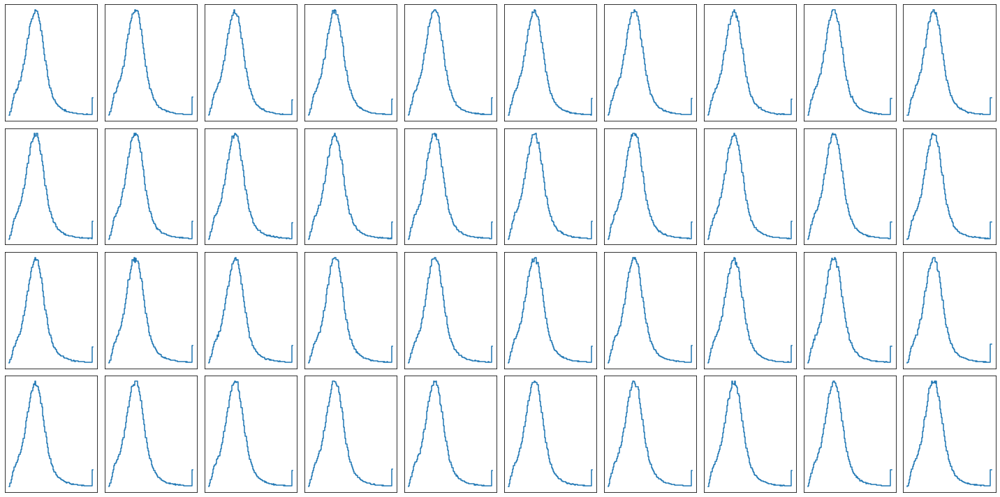

In [45]:
bins = np.arange(0,102)
fig, axes = plt.subplots(4, 10, figsize=(20,10))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.step(bins, meRR_df[meRR_df['fromrun']==297178]['chargeInner_PXLayer_1_hist'].values[i])
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

At a first glance, the histograms look nearly identical. Notice that after bin 60, the histogram drops of to 0 and that the main feature of all of the histograms is the peak on the left hand side.

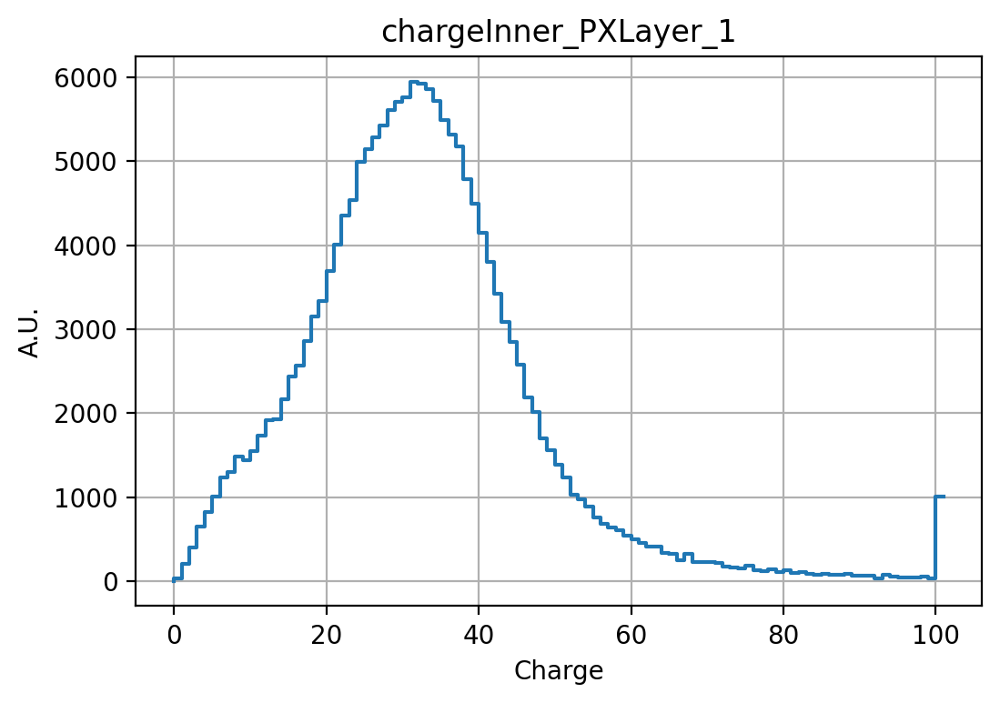

In [462]:
fig, ax = plt.subplots(dpi=200)
ax.step(np.arange(0,102), meRR_df[meRR_df['fromrun']==297178]['chargeInner_PXLayer_1_hist'].values[0])
ax.set_title('chargeInner_PXLayer_1')
ax.set_xlabel('Charge')
ax.set_ylabel('A.U.')
ax.grid()

Given that we are able to characterize the behavior of these monitoring elements by only considering those bins near the peak, we will be choosing only the first 62 bins. This will shrink our dataset to a more manageable level, appropriate for the hardware limitations present in this project.

With this in mind, we can go ahead and create our training dataset from the reference run that is available in our data. With the current file being used, we only have the reference run 297178 available for that, but this suffices as it is relatively long run and so contains a substantial amount of statistics. Furthermore, this project is a proof of concept so, although further testing with more reference runs would be required for a more comprehensive evaluation of the anomaly detection approach used here, it is enough for our purposes.

In [233]:
X_train = np.stack(meRR_df[meRR_df['fromrun']==297178]['chargeInner_PXLayer_1_hist'].values)[:,:62]

In order to visualize the behavior and shape of the histogram along all of the lumisections, we can plot the data as a heatmap. Each row will correspond to a lumisection and each column will be a bin in the 62 bin wide histograms of our dataset.

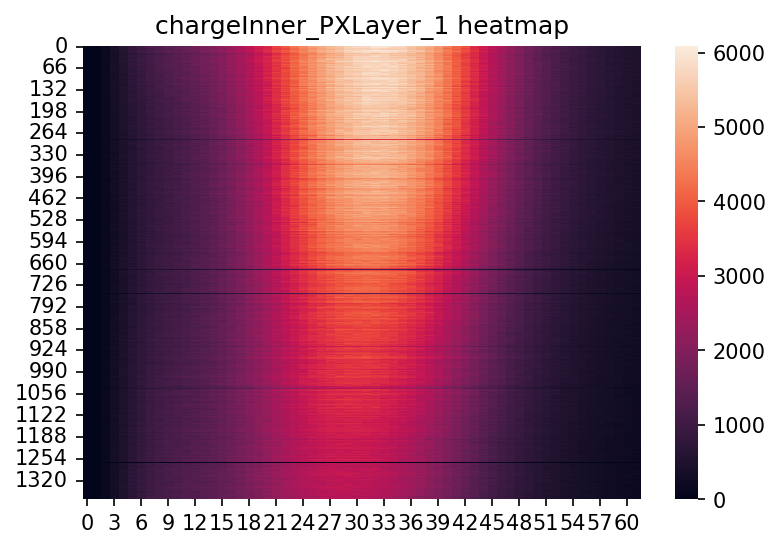

In [234]:
pltu.heatmap(X_train, title='chargeInner_PXLayer_1 heatmap', dpi=150)
plt.show()

We can see that a small subset of the lumisections in this dataset seem to be missing. However, this is an illusion as it is only an effect of the heatmap. In order for the autoencoder we will be build to converge and be able to reconstruct the data, and to avoid this issue with the heatmaps, we will normalize our dataset by having all of the histograms have an under them equal to unity.

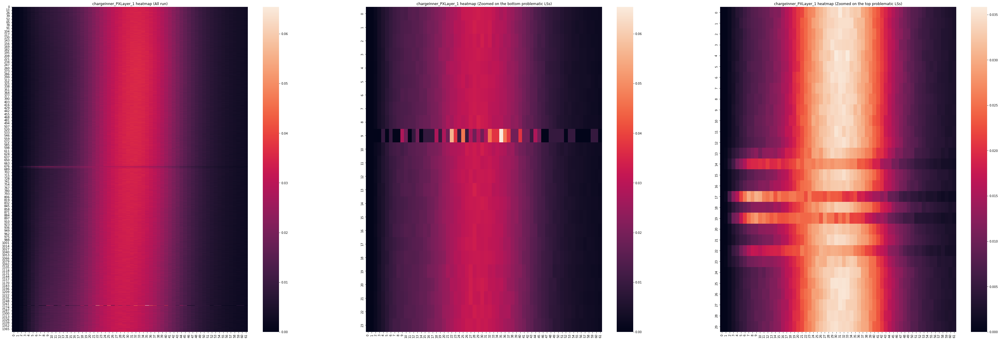

In [235]:
X_train_norm = datau.normalizeME(X_train)
fig, ax = plt.subplots(1, 3, figsize=(60,20))
ax[0] = pltu.heatmapsfig(X_train_norm, ax=ax[0], title='chargeInner_PXLayer_1 heatmap (All run)', dpi=150)
ax[1] = pltu.heatmapsfig(X_train_norm[1256:1280], ax=ax[1], title='chargeInner_PXLayer_1 heatmap (Zoomed on the bottom problematic LSs)', dpi=150)
ax[2] = pltu.heatmapsfig(X_train_norm[660:690], ax=ax[2], title='chargeInner_PXLayer_1 heatmap (Zoomed on the top problematic LSs)', dpi=150)
plt.show()

On the left hand side, we can see all of the training lumisections stacked and plotted as a histogram. As can be seen, when the dataset is normalized, we can appreciate that almost none of the lumisections have any problems. However, there are a couple of lumisection which appear to have some issue. In the heat map in the middle, we have zoomed in to the problematic lumisection that can be seen at around lumisection 1274. From this new perspective, it is clear that this consists of a single anomalous lumisection. Moreover, on the heat map on the right hand side, where we have zoomed on the problematic lumisections that can be seen near lumisection 676, we can observe that the number of lumisections here that have some issue is just 8. With the proportion of good lumisections to problematic lumisection being so large, we do not have to worry about using this dataset for training.

For completeness, we look at the shape of all of the histograms to have a better idea of how those problematic lumisections look like. Here, we have plotted all of the histograms. In this plot we can see that only three histograms show a large deviation from the general shape and that one of them, the brown one, is due to a small number of entries in the histogram.

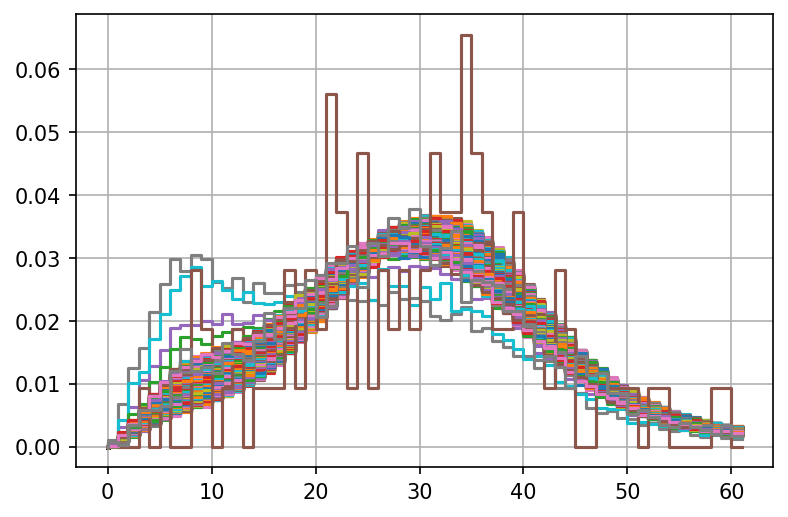

In [482]:
fig, ax = plt.subplots(dpi=150)
for train_hist in X_train_norm:
    ax.step(bins, train_hist)
plt.grid()

<h1><font color='blue'>Building and training the autoencoder</font></h1>

We use tensorflow to build our autoencoder. It's important to note that two versions of the autoencoder were used during testing and the one with the highest translational invariance (i.e. the one which was able to succesfully reconstruct the original histogram even if it is displaced) was chosen. The first model constructed can be seen below. It is a simple fully connected neural network which uses LeakyReLU for all of its activation functions. 

In [153]:
class autoencoder(Model):
    def __init__(self):
        super(autoencoder, self).__init__()
        
        # Encoder
        self.encoder_layer1 = Dense(32, name='encoder_layer1')
        self.leaky_relu1 = LeakyReLU(alpha=0.01, name='lrelu1')
        self.encoder_layer2 = Dense(12, name='encoder_layer2')
        self.leaky_relu2 = LeakyReLU(alpha=0.01, name='lrelu2')
        self.encoder_layer3 = Dense(8, name='encoder_layer3')
        self.leaky_relu3 = LeakyReLU(alpha=0.01, name='lrelu3')
        
        # Decoder
        self.decoder_layer1 = Dense(12, name='decoder_layer1')
        self.leaky_relu4 = LeakyReLU(alpha=0.01, name='lrelu4')
        self.decoder_layer2 = Dense(32, name='decoder_layer2')
        self.leaky_relu5 = LeakyReLU(alpha=0.01, name='lrelu5')
        self.decoder_output = Dense(62, activation='softmax', name='decoder_output')
    
    def call(self, inputs):
        # Passing through encoder
        x = self.encoder_layer1(inputs)
        x = self.leaky_relu1(x)
        x = self.encoder_layer2(x)
        x = self.leaky_relu2(x)
        encoded = self.encoder_layer3(x)
        encoded = self.leaky_relu3(encoded)
        
        # Passing through decoder
        x = self.decoder_layer1(encoded)
        x = self.leaky_relu4(x)
        x = self.decoder_layer2(x)
        x = self.leaky_relu5(x)
        decoded = self.decoder_output(x)
        
        return decoded

As a quick test of its performance and to see how translationally invariant it is, we can use it to reconstruct a particular good run. To do this, we first train it using the reference run and then pass the target run through it. For the loss we will us the mean squared error and we will use adam as our optimizer.

In [679]:
ae_pxl1_old = autoencoder()
ae_pxl1_old.compile(optimizer='adam', loss=mse)
ae_pxl1_old.build((None, 62))
ae_pxl1_old.summary()

Model: "autoencoder_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_layer1 (Dense)      multiple                  2016      
                                                                 
 lrelu1 (LeakyReLU)          multiple                  0         
                                                                 
 encoder_layer2 (Dense)      multiple                  396       
                                                                 
 lrelu2 (LeakyReLU)          multiple                  0         
                                                                 
 encoder_layer3 (Dense)      multiple                  104       
                                                                 
 lrelu3 (LeakyReLU)          multiple                  0         
                                                                 
 decoder_layer1 (Dense)      multiple               

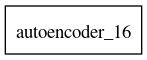

In [1048]:
plot_model(ae_pxl1_old)

In [677]:
# Segmenting the training data into validation and training.
X_train, X_val = train_test_split(X_train_norm, test_size=0.2)

In [629]:
print('Amount of LSs in X_train:', len(X_train), '; Amount of LSs in X_val:', len(X_val))

Amount of LSs in X_train: 1102 ; Amount of LSs in X_val: 276


Training time:
- CPU times: user 27.8 s, sys: 6.98 s, total: 34.8 s
- Wall time: 31.5 s

In [680]:
%%time
history = ae_pxl1_old.fit(X_train, X_train, epochs=350, batch_size=128, validation_data=(X_val, X_val))
# CPU times: user 27.8 s, sys: 6.98 s, total: 34.8 s
# Wall time: 31.5 s

Epoch 1/350
9/9 [==============================] - 2s 38ms/step - loss: 1.2258e-04 - val_loss: 1.2095e-04
Epoch 2/350
9/9 [==============================] - 0s 9ms/step - loss: 1.1957e-04 - val_loss: 1.1779e-04
Epoch 3/350
9/9 [==============================] - 0s 10ms/step - loss: 1.1633e-04 - val_loss: 1.1443e-04
Epoch 4/350
9/9 [==============================] - 0s 9ms/step - loss: 1.1286e-04 - val_loss: 1.1077e-04
Epoch 5/350
9/9 [==============================] - 0s 9ms/step - loss: 1.0901e-04 - val_loss: 1.0662e-04
Epoch 6/350
9/9 [==============================] - 0s 10ms/step - loss: 1.0458e-04 - val_loss: 1.0176e-04
Epoch 7/350
9/9 [==============================] - 0s 9ms/step - loss: 9.9303e-05 - val_loss: 9.5838e-05
Epoch 8/350
9/9 [==============================] - 0s 9ms/step - loss: 9.2813e-05 - val_loss: 8.8469e-05
Epoch 9/350
9/9 [==============================] - 0s 9ms/step - loss: 8.4679e-05 - val_loss: 7.9171e-05
Epoch 10/350
9/9 [==============================] - 

In [682]:
ae_pxl1_old.save('./single_AEs/nonconvAE', save_format='tf')

INFO:tensorflow:Assets written to: ./single_AEs/nonconvAE/assets


INFO:tensorflow:Assets written to: ./single_AEs/nonconvAE/assets


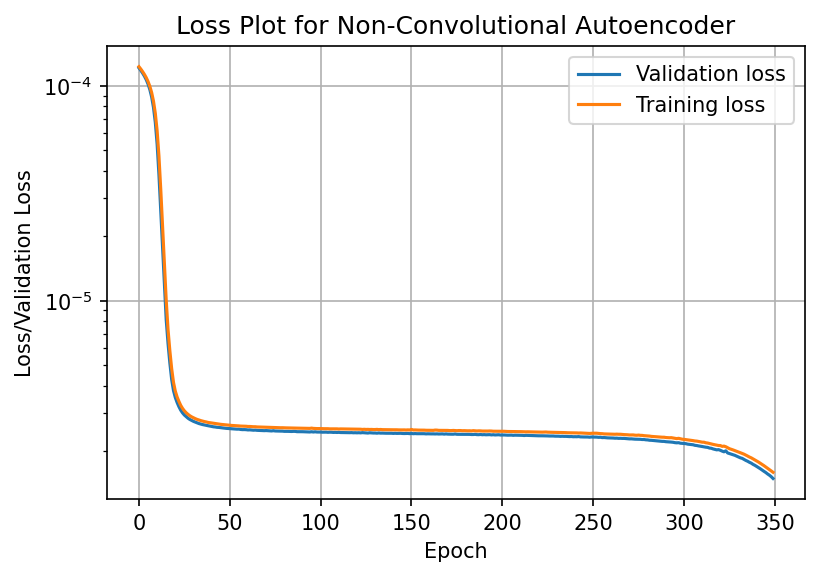

In [681]:
fig, ax = plt.subplots(dpi=150)
ax.plot(history.history['val_loss'], label='Validation loss')
ax.plot(history.history['loss'], label='Training loss')
ax.set_ylabel('Loss/Validation Loss')
ax.set_xlabel('Epoch')
ax.grid()
ax.set_yscale('log')
ax.legend()
ax.set_title('Loss Plot for Non-Convolutional Autoencoder')

plt.show()

From the loss plot we can see that after about 350 epochs, the validation and training losses begin dropping and diverging, symbolizing the point just before the model begins to overfit. That is why the training was stopped at exactly that point. Testing this model with a run it has never seen, we can get a quick sense of how translationally invariant it is.

In [642]:
run_target = 297050
X_test = np.stack(megood_df[megood_df['fromrun']==run_target]['chargeInner_PXLayer_1_hist'].values)[:,:62]
X_test = datau.normalizeME(X_test)

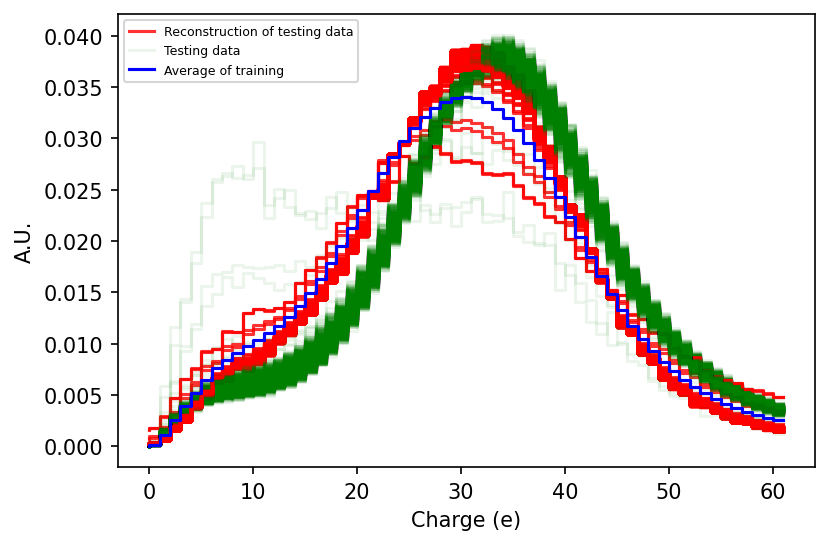

In [683]:
ae_reco = ae_pxl1_old(X_test)

fig, ax = plt.subplots(dpi=150)

for i, (reco, test) in enumerate(zip(ae_reco, X_test)):
    if i == 0:
        ax.step(bins, reco, color='red', alpha=0.8, label='Reconstruction of testing data')
        ax.step(bins, test, color='green', alpha=0.08, label='Testing data')
    ax.step(bins, reco, color='red', alpha=0.8)
    ax.step(bins, test, color='green', alpha=0.08)
ax.step(bins, X_train_norm.mean(axis=0), color='blue', alpha=1, label='Average of training')
ax.legend(loc='upper left', fontsize=6)

ax.set_xlabel('Charge (e)')
ax.set_ylabel('A.U.')

plt.show()

We can see that the model is not so translationally invariant and this will mean that the reconstruction error will tend to be large. The problem with this is it will give the impression that there is a problem with the monitoring elements, when the only thing that is happening is that the histograms are translated with respect to the ones the model was trained on, and not that there is any real problem with the input run. Although the model doesn't have to be perfectly translationally invariant, its reconstructions should be able to approach the input run histograms as best as possible.

In order to resolve this issue, we use a different model which has some added convolutional layers. The model class is defined as such...

In [211]:
class autoencoderconv(Model):
    def __init__(self):
        super(autoencoderconv, self).__init__()
        
        # Convolutional layers
        self.leaky_relu1 = LeakyReLU(alpha=0.01, name='lrelu1')
        self.conv1 = Conv1D(32, 5, padding='same', name='conv1')
        self.leaky_relu2 = LeakyReLU(alpha=0.01, name='lrelu2')
        self.conv2 = Conv1D(32, 5, padding='same', name='conv2')
        self.leaky_relu3 = LeakyReLU(alpha=0.01, name='lrelu3')
        
        # Encoder
        self.encoder_layer1 = Dense(32, name='encoder_layer1')
        self.leaky_relu4 = LeakyReLU(alpha=0.01, name='lrelu4')
        self.encoder_layer2 = Dense(12, name='encoder_layer2')
        self.leaky_relu5 = LeakyReLU(alpha=0.01, name='lrelu5')
        self.encoder_layer3 = Dense(8, name='encoder_layer3')
        self.leaky_relu6 = LeakyReLU(alpha=0.01, name='lrelu7')
        
        # Decoder
        self.decoder_layer1 = Dense(12, name='decoder_layer1')
        self.leaky_relu7 = LeakyReLU(alpha=0.01, name='lrelu7')
        self.decoder_layer2 = Dense(32, name='decoder_layer2')
        self.leaky_relu8 = LeakyReLU(alpha=0.01, name='lrelu8')
        
        # Convolutional layers
        self.reshape = Reshape((32, 1))
        self.conv3 = Conv1D(32, 5, padding='same', name='conv3')
        self.flatten = Flatten()
        
        # Output
        self.decoder_output = Dense(62, activation='softmax', name='decoder_output')
    
    def call(self, inputs):
        # Add a dimension to input for the conv layer
        x = tf.expand_dims(inputs, axis=2)
        
        # Convolutional layer at the beginning
        x = self.conv1(x)
        x = self.leaky_relu1(x)
        x = self.conv2(x)
        x = self.leaky_relu2(x)
        x = self.flatten(x)
        
        # Passing through encoder
        x = self.encoder_layer1(x)
        x = self.leaky_relu3(x)
        x = self.encoder_layer2(x)
        x = self.leaky_relu4(x)
        x = self.encoder_layer3(x)
        x = self.leaky_relu5(x)
        
        # Passing through decoder
        x = self.decoder_layer1(x)
        x = self.leaky_relu6(x)
        x = self.decoder_layer2(x)
        x = self.leaky_relu7(x)
        
        x = self.reshape(x)
        x = self.conv3(x)
        x = self.leaky_relu8(x)
        x = self.flatten(x)
        x = self.decoder_output(x)
        
        return x

We now train this model the same way we trained the previous model.

In [690]:
ae_pxl1 = autoencoderconv()
ae_pxl1.compile(optimizer='adam', loss=mse)
ae_pxl1.build((None, 62))
ae_pxl1.summary()

Model: "autoencoderconv_58"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lrelu1 (LeakyReLU)          multiple                  0         
                                                                 
 conv1 (Conv1D)              multiple                  192       
                                                                 
 lrelu2 (LeakyReLU)          multiple                  0         
                                                                 
 conv2 (Conv1D)              multiple                  5152      
                                                                 
 lrelu3 (LeakyReLU)          multiple                  0         
                                                                 
 encoder_layer1 (Dense)      multiple                  63520     
                                                                 
 lrelu4 (LeakyReLU)          multiple           

In [1046]:
plot_model(ae_px)

In [605]:
# X_train_single, X_val_single = train_test_split(X_train_norm, test_size=0.2, random_state=1)

Training time:
- CPU times: user 1min 35s, sys: 15.4 s, total: 1min 51s
- Wall time: 1min 8s

In [691]:
%%time
history = ae_pxl1.fit(X_train, X_train, epochs=350, batch_size=128, validation_data=(X_val, X_val))
# CPU times: user 1min 35s, sys: 15.4 s, total: 1min 51s
# Wall time: 1min 8s

Epoch 1/350
9/9 [==============================] - 3s 64ms/step - loss: 1.2247e-04 - val_loss: 1.2069e-04
Epoch 2/350
9/9 [==============================] - 0s 22ms/step - loss: 1.1901e-04 - val_loss: 1.1656e-04
Epoch 3/350
9/9 [==============================] - 0s 21ms/step - loss: 1.1396e-04 - val_loss: 1.0981e-04
Epoch 4/350
9/9 [==============================] - 0s 22ms/step - loss: 1.0520e-04 - val_loss: 9.7582e-05
Epoch 5/350
9/9 [==============================] - 0s 22ms/step - loss: 8.9306e-05 - val_loss: 7.5708e-05
Epoch 6/350
9/9 [==============================] - 0s 22ms/step - loss: 6.1662e-05 - val_loss: 3.9539e-05
Epoch 7/350
9/9 [==============================] - 0s 22ms/step - loss: 2.3095e-05 - val_loss: 1.1204e-05
Epoch 8/350
9/9 [==============================] - 0s 23ms/step - loss: 9.8847e-06 - val_loss: 5.8327e-06
Epoch 9/350
9/9 [==============================] - 0s 23ms/step - loss: 5.8503e-06 - val_loss: 5.2096e-06
Epoch 10/350
9/9 [============================

In [557]:
ae_pxl1.save('./single_AEs/convAE', save_format='tf')

2023-11-16 02:53:16.915337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 02:53:17.502438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./single_AEs/convAE/assets


INFO:tensorflow:Assets written to: ./single_AEs/convAE/assets


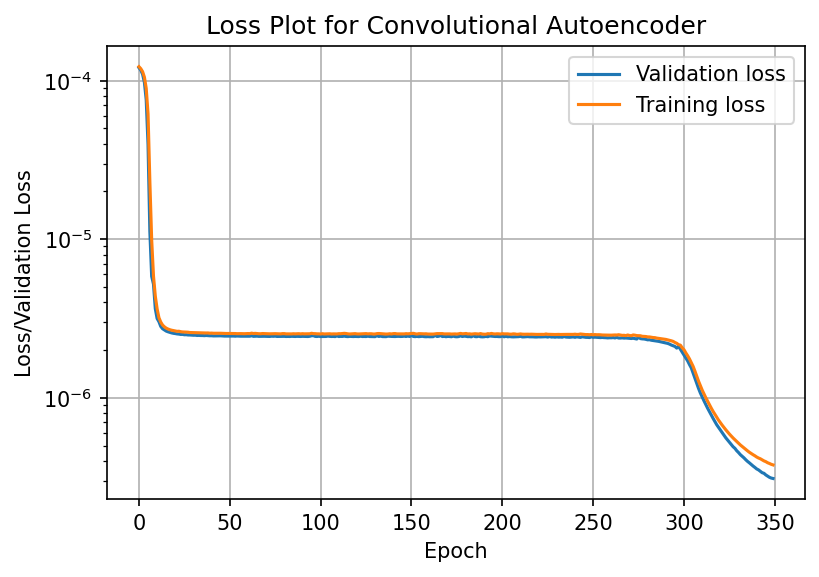

In [692]:
fig, ax = plt.subplots(dpi=150)
ax.plot(history.history['val_loss'], label='Validation loss')
ax.plot(history.history['loss'], label='Training loss')
ax.set_ylabel('Loss/Validation Loss')
ax.set_xlabel('Epoch')
ax.grid()
ax.set_yscale('log')
ax.legend()
ax.set_title('Loss Plot for Convolutional Autoencoder')

plt.show()

We see from the loss plot that the validation and training loss began to differ more near the end of the training. Although this divergence might seem significant, we need to keep in mind that the y-axis in this loss plot is logarithmic, so, in actuality, the difference in loss here is miniscule. Despite this, to avoid overfitting, the training was stopped as soon after this divergence began.

With the model trained, we test it on the same data we trained the other model on.

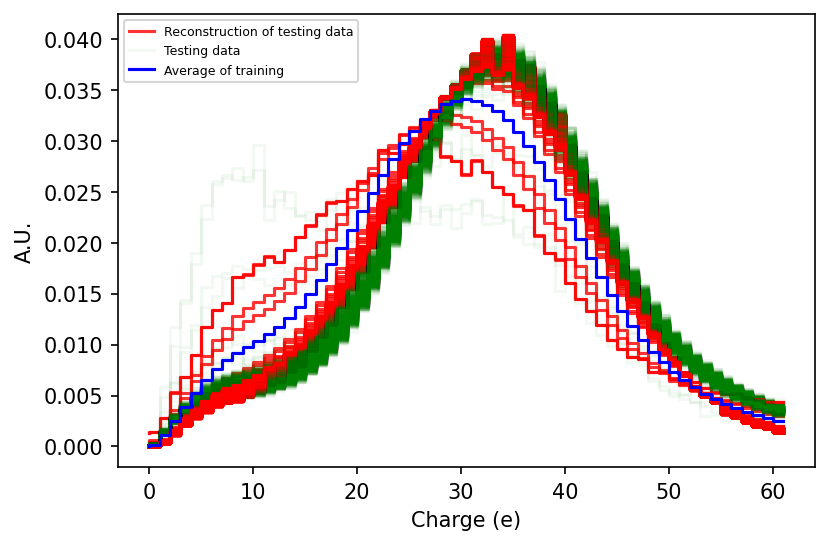

In [693]:
ae_reco = ae_pxl1(X_test)

fig, ax = plt.subplots(dpi=150)

for i, (reco, test) in enumerate(zip(ae_reco, X_test)):
    if i == 0:
        ax.step(bins, reco, color='red', alpha=0.8, label='Reconstruction of testing data')
        ax.step(bins, test, color='green', alpha=0.05, label='Testing data')
    ax.step(bins, reco, color='red', alpha=0.8)
    ax.step(bins, test, color='green', alpha=0.05)
ax.step(bins, X_train_norm.mean(axis=0), color='blue', alpha=1, label='Average of training')
ax.legend(loc='upper left', fontsize=6)

ax.set_xlabel('Charge (e)')
ax.set_ylabel('A.U.')

plt.show()

As we can see, this new model performs better in terms of translational invariance. However, it is also evident that it is not perfect as the reconstructions are not completely alligned with the test data. This, however, is acceptable: because we intend to build an autoencoder ensemble out of this base model, the model itself needs to be as simple as possible while still performing well. Moreover, while the peak of the histograms might shift and the lumisection is still considered good, a too large shift would be problematic, so our model needs to have some limitations in terms of its invariance to shifts in the histograms. To get an idea of the scale of the MSE here, we check the maximum, minimum, mean and standard deviation of the reconstructions.

In [694]:
MSE = np.array(mse(ae_reco, X_test))

print(
    '''
        Max MSE: {}
        Min MSE: {}
        Mean MSE: {}
        STD of MSE: {}
    '''.format(MSE.max(),
              MSE.min(),
              MSE.mean(),
              MSE.std()
              )
)


        Max MSE: 2.5535387822383642e-05
        Min MSE: 1.7948126113798602e-06
        Mean MSE: 3.107983884161326e-06
        STD of MSE: 1.3945899634012595e-06
    


<h1><font color='blue'> Building and Training the Autoencoder Ensemble </font></h1>

We now proceed to build the autoencoder ensemble out of the second model we developed. For this, we use dictionary comprehension and the list of the monitoring element names to build a dictionary of autoencoders.

In [695]:
# Function which returns autoencode instance
def create_ae():
    return autoencoderconv()
ensemble = {name + '_AE': create_ae() for name in monitoring_elems}

The names of our autoencoders are the following:

In [554]:
list(ensemble.keys())

['chargeInner_PXLayer_1_AE',
 'chargeInner_PXLayer_2_AE',
 'chargeInner_PXLayer_3_AE',
 'chargeInner_PXLayer_4_AE',
 'chargeOuter_PXLayer_1_AE',
 'chargeOuter_PXLayer_2_AE',
 'chargeOuter_PXLayer_3_AE',
 'chargeOuter_PXLayer_4_AE',
 'charge_PXDisk_+1_AE',
 'charge_PXDisk_+2_AE',
 'charge_PXDisk_+3_AE',
 'charge_PXDisk_-1_AE',
 'charge_PXDisk_-2_AE',
 'charge_PXDisk_-3_AE',
 'num_clusters_ontrack_PXBarrel_AE',
 'num_clusters_ontrack_PXForward_AE']

In [555]:
print('''
    Number of training datasets (one for each AE/ME type): {}
    Number of datapoints/LSs: {}
    Number of features/bins: {}
    '''.format(Xs_train_norm.shape[0],
              Xs_train_norm.shape[1],
              Xs_train_norm.shape[2])
)


    Number of training datasets (one for each AE/ME type): 16
    Number of datapoints/LSs: 1378
    Number of features/bins: 62
    


We can take a look at the heatmaps for all the monitoring elements in order to get a sense of how the histograms for each look. In order to do this, we construct the training dataset in order to visualize it and then, from that, build the heatmaps.

In [696]:
Xs_train = np.array([np.stack(meRR_df[meRR_df['fromrun']==297178][me+'_hist'].values) for me in monitoring_elems])[:,:,:62]
Xs_train_norm = datau.normalizeMEs(Xs_train)

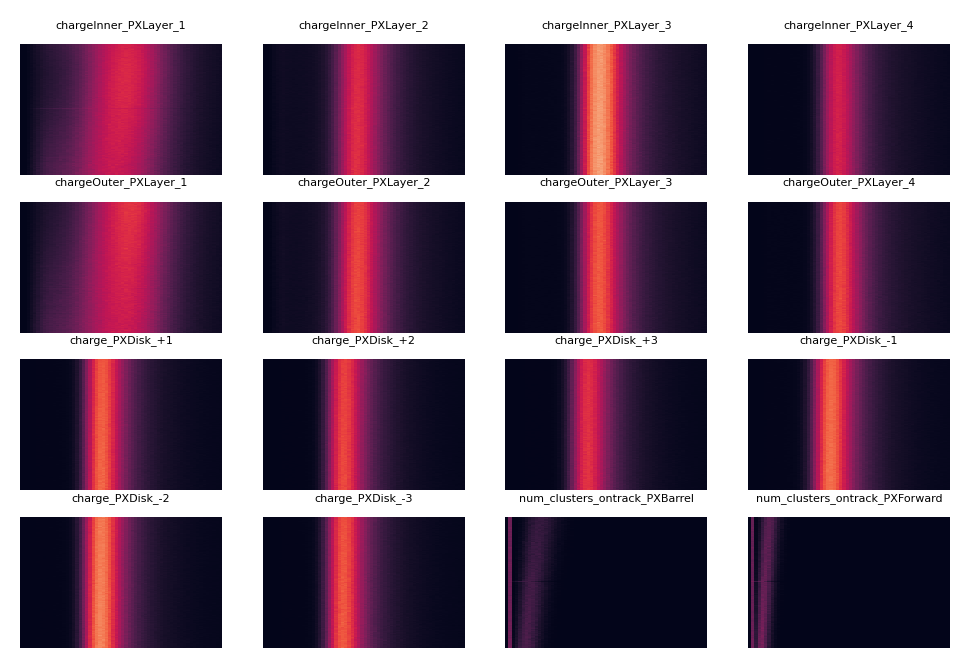

In [559]:
pltu.heatmaps(Xs_train_norm, monitoring_elems, dpi=200)

With the constructed ensemble, we compile and build all of the models and then proceed to train all of them on the same reference run we were using before. Note that each autoencoder will only train on a particular type of monitoring element (i.e. a particular type of histogram), so each of them will specialize in reconstructing only one type of histogram. In addition to this, all the model are trained using the MSE as the loss and the optimizer user is adam.

In [697]:
for me in monitoring_elems:
    ensemble[me+'_AE'].compile(optimizer='adam', loss=mse)
    ensemble[me+'_AE'].build((None,62))

In [698]:
%%time
histories = []
for i, me in enumerate(monitoring_elems):
    X_train, X_val = train_test_split(Xs_train_norm[i], test_size=0.2, random_state=1)
    histories.append(ensemble[me+'_AE'].fit(X_train, X_train, epochs=350, batch_size=128, validation_data=(X_val, X_val)))
# CPU times: user 22min 7s, sys: 3min 38s, total: 25min 46s
# Wall time: 15min 47s

Epoch 1/350
9/9 [==============================] - 3s 62ms/step - loss: 1.2250e-04 - val_loss: 1.2077e-04
Epoch 2/350
9/9 [==============================] - 0s 23ms/step - loss: 1.1915e-04 - val_loss: 1.1681e-04
Epoch 3/350
9/9 [==============================] - 0s 23ms/step - loss: 1.1437e-04 - val_loss: 1.1048e-04
Epoch 4/350
9/9 [==============================] - 0s 22ms/step - loss: 1.0613e-04 - val_loss: 9.8944e-05
Epoch 5/350
9/9 [==============================] - 0s 23ms/step - loss: 9.1222e-05 - val_loss: 7.8798e-05
Epoch 6/350
9/9 [==============================] - 0s 24ms/step - loss: 6.6805e-05 - val_loss: 4.8928e-05
Epoch 7/350
9/9 [==============================] - 0s 23ms/step - loss: 3.5068e-05 - val_loss: 1.7995e-05
Epoch 8/350
9/9 [==============================] - 0s 23ms/step - loss: 1.2013e-05 - val_loss: 8.9129e-06
Epoch 9/350
9/9 [==============================] - 0s 22ms/step - loss: 8.0450e-06 - val_loss: 5.7507e-06
Epoch 10/350
9/9 [============================

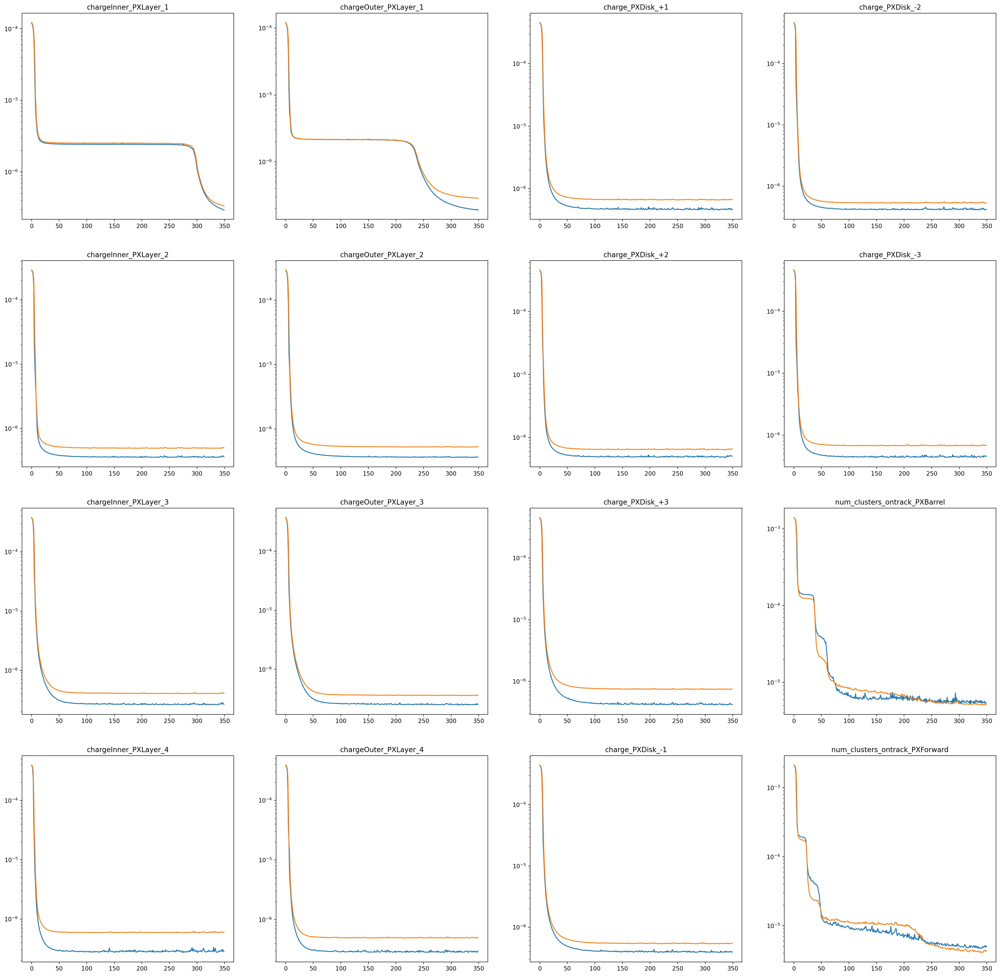

In [991]:
fig, axes = plt.subplots(4, 4, figsize=(30,30))
for i in range(0,4):
    for j in range(0,4):
        ax = axes[i, j]
        ax.plot(histories[i + 4*j].history['val_loss'], label='Validation loss')
        ax.plot(histories[i + 4*j].history['loss'], label='Training loss')
        ax.set_title(monitoring_elems[i + 4*j], fontsize=12)
        ax.set_yscale('log')
fig.set_dpi(200)
plt.show()

In [712]:
# Optional: Saving the models
for ME_name in monitoring_elems:
    model_path = f'./models/AEConvEnsemble_{ME_name}'
    ensemble[ME_name + '_AE'].save(model_path, save_format='tf')

2023-11-16 13:21:05.118469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:21:05.704253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeInner_PXLayer_1/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeInner_PXLayer_1/assets
2023-11-16 13:21:13.488363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:21:14.087528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeInner_PXLayer_2/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeInner_PXLayer_2/assets
2023-11-16 13:21:17.855522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:21:18.456054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeInner_PXLayer_3/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeInner_PXLayer_3/assets
2023-11-16 13:21:22.404098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:21:22.997461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeInner_PXLayer_4/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeInner_PXLayer_4/assets
2023-11-16 13:21:29.849635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:21:30.475597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeOuter_PXLayer_1/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeOuter_PXLayer_1/assets
2023-11-16 13:21:34.091363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:21:34.681255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeOuter_PXLayer_2/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeOuter_PXLayer_2/assets
2023-11-16 13:21:38.279416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:21:38.867239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeOuter_PXLayer_3/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeOuter_PXLayer_3/assets
2023-11-16 13:21:42.335349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:21:42.919392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeOuter_PXLayer_4/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_chargeOuter_PXLayer_4/assets
2023-11-16 13:21:50.998884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:21:51.584817: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_+1/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_+1/assets
2023-11-16 13:21:55.141552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:21:55.731541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_+2/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_+2/assets
2023-11-16 13:21:59.579414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:22:00.168479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_+3/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_+3/assets
2023-11-16 13:22:06.900727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:22:07.485201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_-1/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_-1/assets
2023-11-16 13:22:11.157559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:22:11.732547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_-2/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_-2/assets
2023-11-16 13:22:15.419570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:22:16.056463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_-3/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_charge_PXDisk_-3/assets
2023-11-16 13:22:19.655872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:22:20.250632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_num_clusters_ontrack_PXBarrel/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_num_clusters_ontrack_PXBarrel/assets
2023-11-16 13:22:26.829817: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]
2023-11-16 13:22:27.422742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,32]
	 [[{{node inputs}}]]


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_num_clusters_ontrack_PXForward/assets


INFO:tensorflow:Assets written to: ./models/AEConvEnsemble_num_clusters_ontrack_PXForward/assets


We now test the ensemble by having it reconstruct a good run which was certified using the reference run the model was trained on. Similar to what we did before, we first get our testing dataset, normalize it, and then run it through the trained models.

In [713]:
run_target = 297050
Xs_test = np.array([np.stack(megood_df[megood_df['fromrun']==run_target][me+'_hist'].values) for me in monitoring_elems])[:,:,:62]
Xs_test_norm = datau.normalizeMEs(Xs_test)

In [714]:
recos = []
for i, (key, AE) in enumerate(ensemble.items()):
    recos.append(AE(Xs_test_norm[i]))
recos = np.array(recos)

We make the heatmap of the original data and the reconstruction for all of the monitoring elements in order to get a general idea of how the did.

Test data...


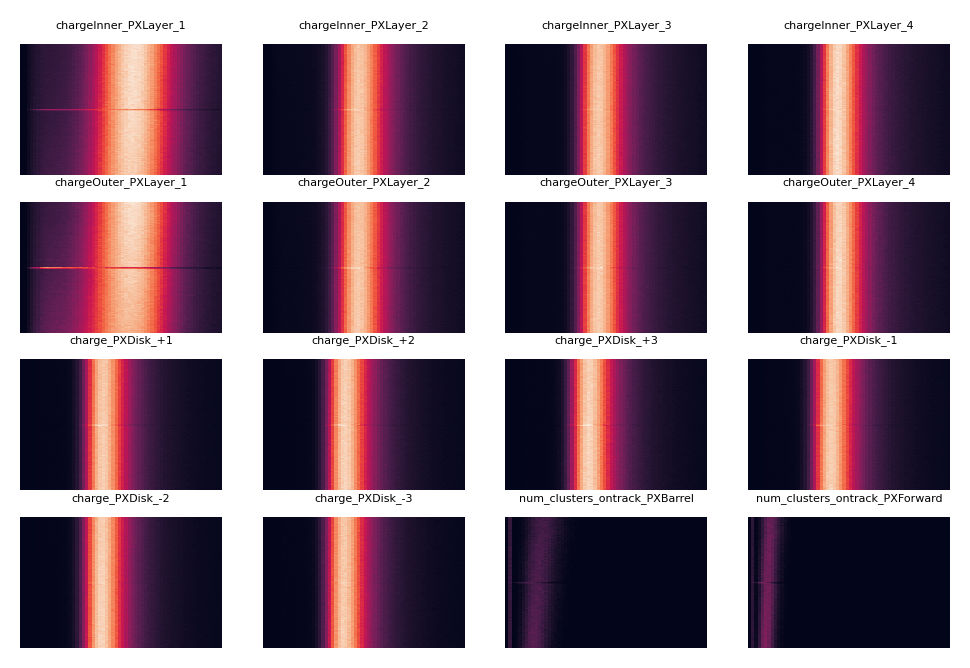


 Reconstructed data...


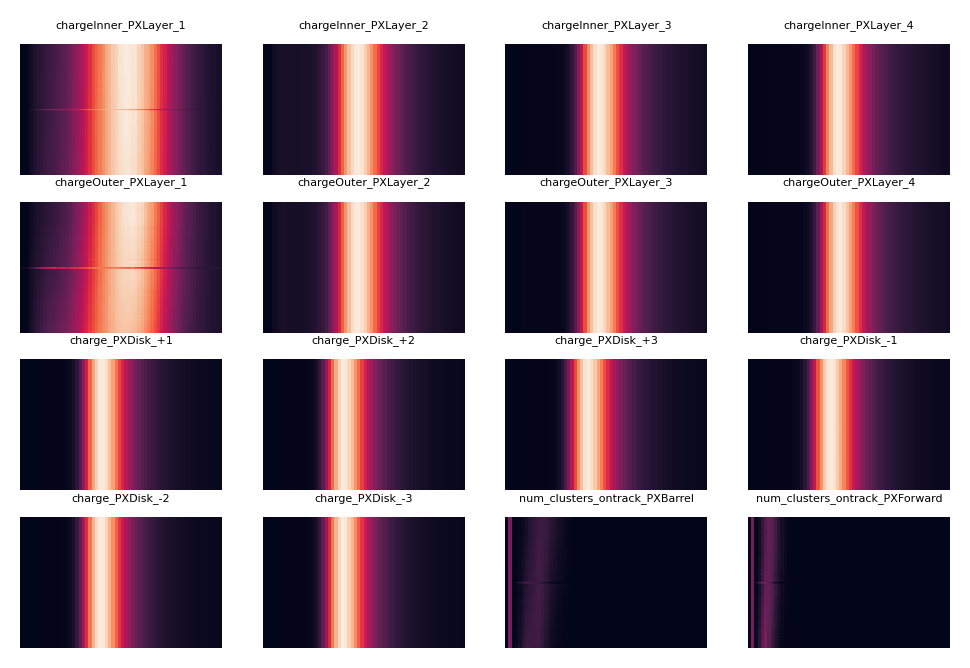

In [715]:
print('Test data...')
pltu.heatmaps(Xs_test_norm, monitoring_elems, dpi=200)

print('\n Reconstructed data...')
pltu.heatmaps(recos, monitoring_elems, dpi=200)

From these, we can see that the model did well at reconstructing the monitoring elements. To quanity how good the model did at reconstructing this good data, we can use the MSE.

In [716]:
results = {'MEname': [], 'Max MSE': [], 'Min MSE': [], 'Mean MSE': [], 'STD of MSE': []}

# Loop over the monitoring elements
for i, MEname in enumerate(monitoring_elems):
    MSE_test = np.array(mse(recos[i], X_test[i]))
    results['MEname'].append(MEname)
    results['Max MSE'].append(MSE_test.max())
    results['Min MSE'].append(MSE_test.min())
    results['Mean MSE'].append(MSE_test.mean())
    results['STD of MSE'].append(MSE_test.std())

results_df = pd.DataFrame(results)
results_df

,MEname,Max MSE,Min MSE,Mean MSE,STD of MSE
0,chargeInner_PXLayer_1,0.000077,0.000012,0.000014,4.203918e-06
1,chargeInner_PXLayer_2,0.000102,0.000101,0.000101,2.688482e-08
2,chargeInner_PXLayer_3,0.000144,0.000144,0.000144,3.314014e-09
3,chargeInner_PXLayer_4,0.000191,0.000191,0.000191,8.333495e-09
4,chargeOuter_PXLayer_1,0.000099,0.000005,0.000012,7.610348e-06
5,chargeOuter_PXLayer_2,0.000105,0.000105,0.000105,3.522861e-09
6,chargeOuter_PXLayer_3,0.000143,0.000143,0.000143,6.614090e-09
7,chargeOuter_PXLayer_4,0.000171,0.000171,0.000171,1.001562e-08
8,charge_PXDisk_+1,0.000332,0.000332,0.000332,2.660548e-08
9,charge_PXDisk_+2,0.000339,0.000339,0.000339,6.255541e-08


Notice that the model has a higher MSE for `num_clusters_ontrack_PXBarrel` and `num_clusters_ontrack_PXForward`. We can take a look at the histograms themselves to see what is going on.

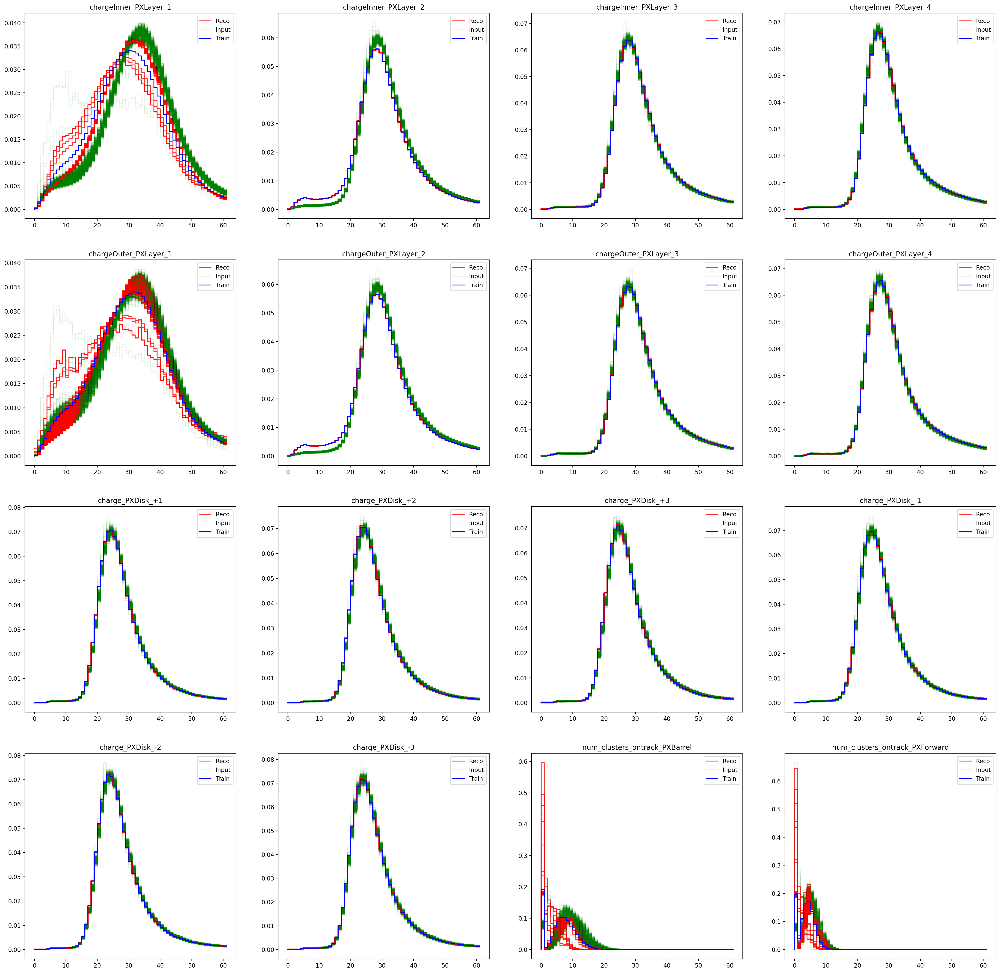

In [717]:
fig, axes = plt.subplots(4, 4, figsize=(30,30), dpi=200)
axes = axes.flatten()

for i, ax in enumerate(axes):
    reco = recos[i]
    test = Xs_test_norm[i]
    for j, histo in enumerate(reco):
        if j == 0: 
            ax.step(bins, histo, color='red', alpha=0.8, label='Reco')
            ax.step(bins, test[j], color='green', alpha=0.08, label='Input')
        ax.step(bins, histo, color='red', alpha=0.8)
        ax.step(bins, test[j], color='green', alpha=0.08)
    ax.step(bins, Xs_train_norm[i].mean(axis=0), color='blue', alpha=1, label='Train')
    ax.legend(loc='upper right')
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    ax.set_title(monitoring_elems[i], fontsize=12)   
plt.show()

From these plots, it is clear that the autoencoder ensemble is able to fairly accurately reconstruct all of the monitoring elements (at least the ones that do not have any adnormal behavior). From the plots for `num_clusters_ontrack_PXBarrel` and `num_clusters_ontrack_PXForward`, we can see that the relatively large MSE is likely cause by the nature of the histograms themselves, as they seem to vary considerably in shape and the underflow bin seems to vary considerably in value. Despite this, these monitoring elements were still able to be reconstructed fairly well. For `charge_InnerPXLayer_2` and `charge_OuterPXLayer_2`, the shape of the training histograms had a feature which is not present in the input data, namely a "bump" to the left side of the peak. This, however, is not problematic and was likely caused by issues with the detector which were not serious enough to impact the quality of the data.

<h1><font color='blue'>Getting MSE Threshold</font></h1>

Now that we see that the autoencoder is able to reconstruct good runs after being trained on the reference run, we proceed to get the MSE thresholds. First we create an array of bad (normalized) runs.

In [718]:
badruns_df = mebad_df[mebad_df['refrun']==297178]

In [719]:
print('Bad runs used:\n', badruns_df['fromrun'].unique())
print('Number of bad runs used:', len(badruns_df['fromrun'].unique()))

Bad runs used:
 [297047 297050 297057 297099 297101 297113 297114 297169 297179 297211
 297296 297411 297426 297431 297474 297483 297486 297503 297557 297598
 297604 297620 297659 297664 297670 297674 297678 297722 299000 299061
 299065 299067 299096 299149 299178 299185 299317 299325 299329]
Number of bad runs used: 39


In [720]:
badruns = []
for badrun in badruns_df['fromrun'].unique():
    badruns.append(np.array([np.stack(badruns_df[badruns_df['fromrun']==badrun][me+'_hist'].values) for me in monitoring_elems])[:,:,:62])

In [721]:
badruns_norm = []
for badrun in badruns:
    temp = np.array(datau.normalizeMEs(badrun))
    if temp.ndim != 0:
        badruns_norm.append(temp)

With the bad dataset now created we can take a look at the heatmaps of one of the runs just as an example

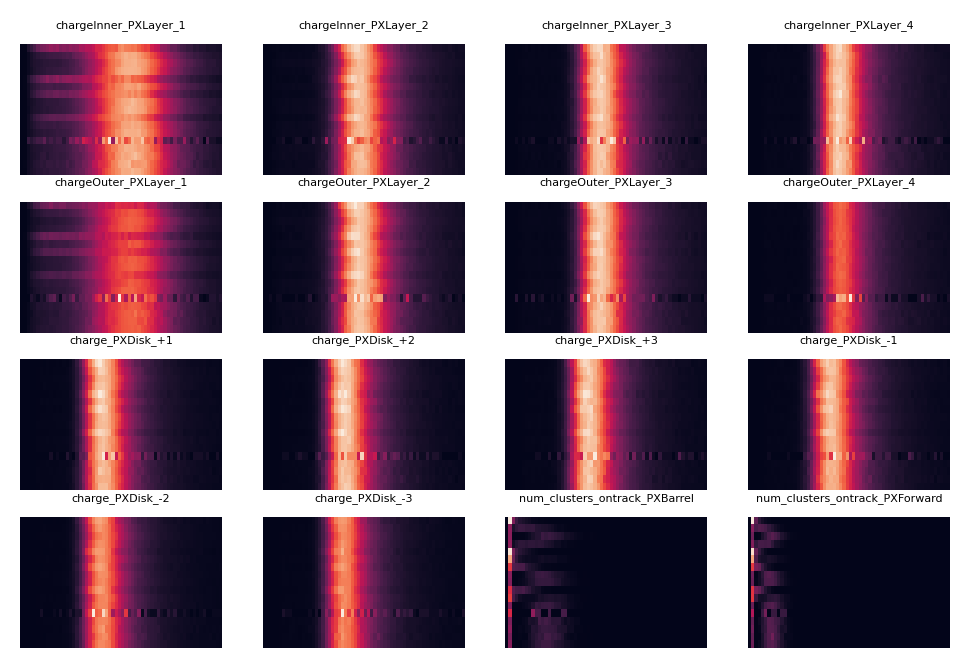

In [722]:
pltu.heatmaps(badruns_norm[1], monitoring_elems, dpi=200)

The measure of anomalousness for each particular monitoring element type of a particular run will be the average MSE (with respect to the reconstruction) across all the lumisections of the run. The threshold are found by determining these exact metrics for bad runs and taking the average of them across the available bad runs. We proceed to determine the thresholds in the aformentioned way.

In [723]:
bad_recos = []
for badrun in badruns_norm:
    bad_reco = []
    for i, (key, AE) in enumerate(ensemble.items()):
        bad_reco.append(AE(badrun[i]))
    bad_recos.append(np.array(bad_reco))

Taking a look at the reconstruction heatmaps, we can see that the model was able to make a qualitively fair reconstruction of most lumisections. However, some of the obviously problematic lumisections in the original data are not present in their reconstruction, meaning that the model was not able to faithfully reconstruct those lumisections.

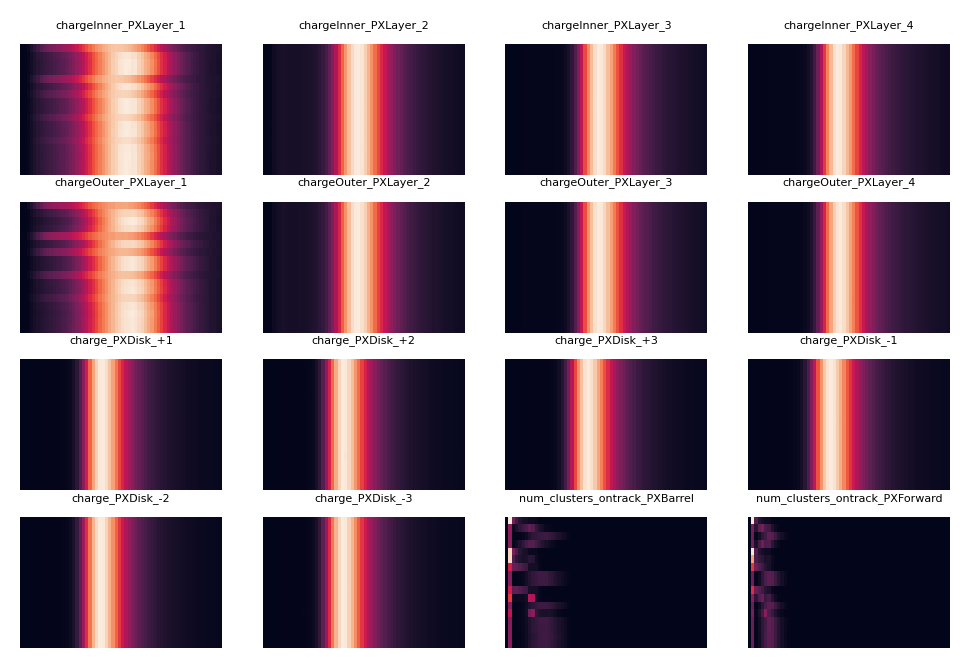

In [724]:
pltu.heatmaps(bad_recos[1], monitoring_elems, dpi=200)

Taking a look at the actual histograms...

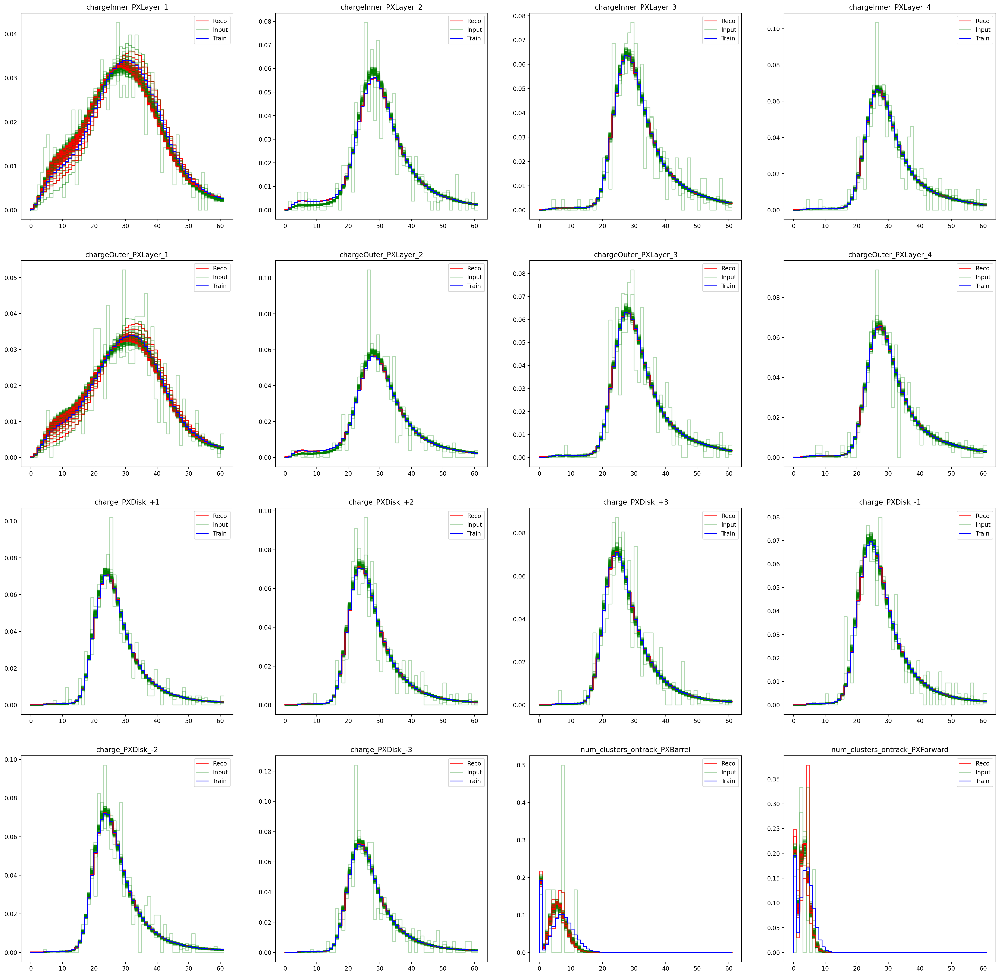

In [725]:
fig, axes = plt.subplots(4, 4, figsize=(30,30), dpi=200)
axes = axes.flatten()

for i, ax in enumerate(axes):
    reco = bad_recos[3][i]
    test = badruns_norm[3][i]
    for j, histo in enumerate(reco):
        if j == 0: 
            ax.step(bins, histo, color='red', alpha=0.8, label='Reco')
            ax.step(bins, test[j], color='green', alpha=0.3, label='Input')
        ax.step(bins, histo, color='red', alpha=0.8)
        ax.step(bins, test[j], color='green', alpha=0.3)
    ax.step(bins, Xs_train_norm[i].mean(axis=0), color='blue', alpha=1, label='Train')
    ax.legend(loc='upper right')
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    ax.set_title(monitoring_elems[i], fontsize=12)   
plt.show()

With the reconstructions, we can now get the MSE.

In [729]:
# For each histogram of each ME type of each run, find the mean MSE
runMSEs = []
for bad_reco, badrun in zip(bad_recos, badruns_norm):
    runMSE = []
    for i in range(len(monitoring_elems)):
        runMEMSE = mse(bad_reco[i], badrun[i])
        runMEmeanMSE = reduce_mean(runMEMSE).numpy().item()
        runMSE.append(np.array(runMEmeanMSE))
    runMSEs.append(np.array(runMSE))
runMSEs = np.array(runMSEs)

This then gives us the final thresholds.

In [730]:
ME_thresholds = np.array(runMSEs).mean(axis=0)
print(ME_thresholds)

[2.18462230e-05 1.94887171e-05 1.07492532e-05 9.83301978e-06
 1.97903398e-05 1.98243423e-05 1.08008452e-05 1.10499067e-05
 1.72083867e-05 1.78486584e-05 1.82221827e-05 1.78925987e-05
 1.50416032e-05 1.48688166e-05 2.79218024e-04 3.00631403e-04]


<h1><font color='blue'>Good Run Evaluation & Analysis</font></h1>

We start by construction the evaluation dataset, i.e. a dataset containing the monitoring elements for runs which were certified as good and which have as reference run the same reference run that was used to train the autoencoder ensemble.

In [731]:
eval_df = megood_df[megood_df['refrun'] == 297178]
eval_runnum = eval_df['fromrun'].unique()

The available runs are the following

In [1049]:
eval_runnum

array([297050, 297057, 297099, 297101, 297113, 297114, 297175, 297177,
       297215, 297218, 297225, 297296, 297411, 297426, 297431, 297434,
       297468, 297483, 297486, 297503, 297557, 297604, 297620, 297670,
       297674, 297722, 298997, 299000, 299061, 299065, 299067, 299096,
       299149, 299178, 299184, 299185, 299327, 299329])

In [733]:
evalruns = []
for evalrun in eval_runnum:
    evalruns.append(np.array([np.stack(eval_df[eval_df['fromrun']==evalrun][me+'_hist'].values) for me in monitoring_elems])[:,:,:62])
    
evalruns_norm = []
for evalrun in evalruns:
    temp = np.array(datau.normalizeMEs(evalrun, filterruns=False, emptyto0=True))
    evalruns_norm.append(temp)

As an example of what this data looks like, we can plot the heatmaps for the first available run which is 297050.

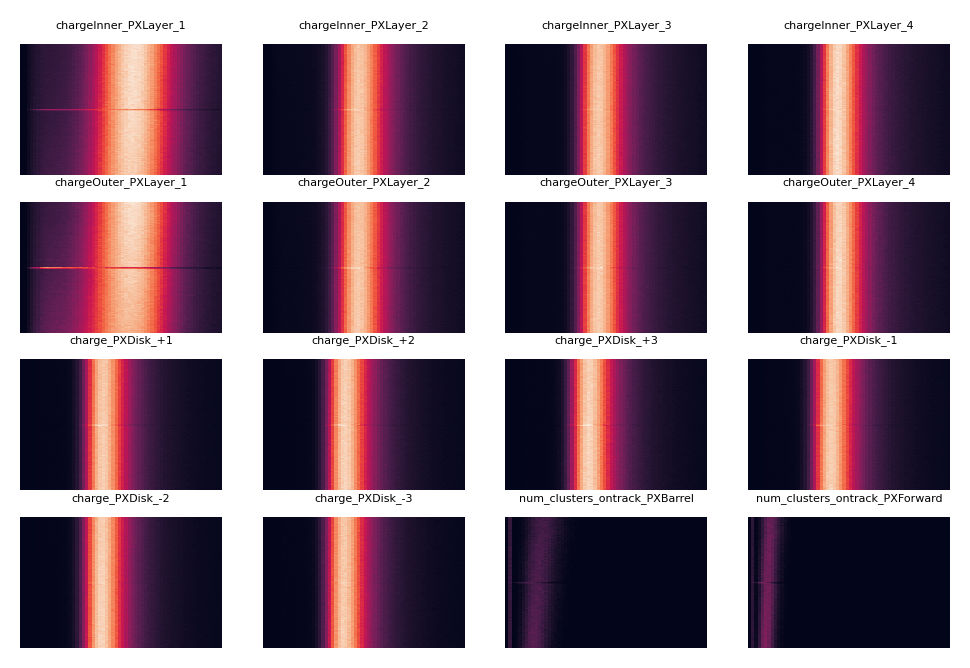

In [734]:
pltu.heatmaps(evalruns_norm[0], monitoring_elems, dpi=200)

We feed all of these runs into our autoencoder. As an example of the output, the heatmaps for run 297050 are shown.

In [735]:
eval_recos = []
for evalrun in evalruns_norm:
    eval_reco = []
    for i, (key, AE) in enumerate(ensemble.items()):
        eval_reco.append(AE(evalrun[i]))
    eval_recos.append(np.array(eval_reco))

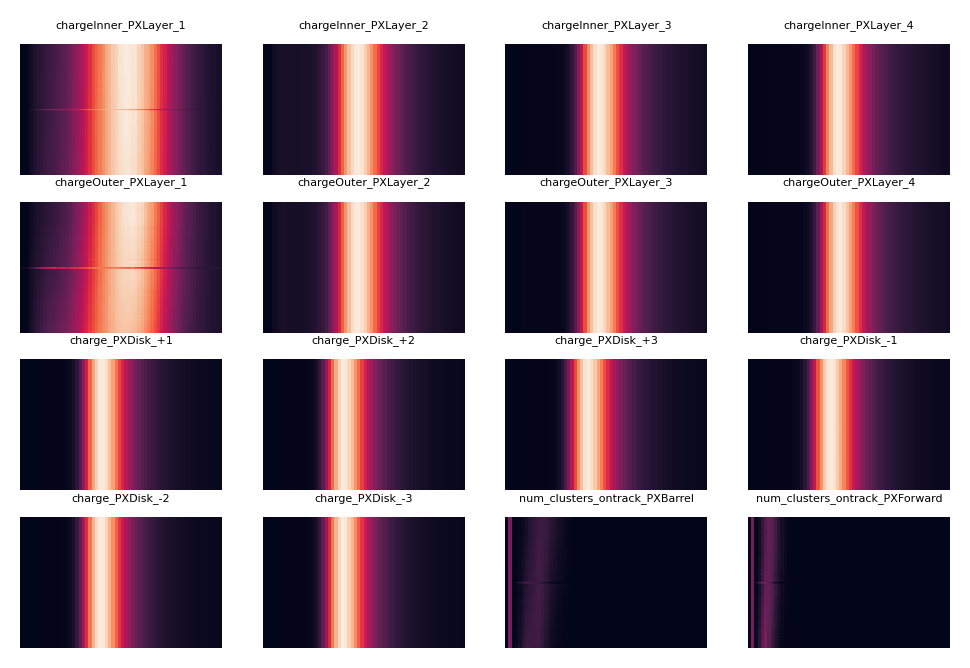

In [736]:
pltu.heatmaps(eval_recos[0], monitoring_elems, dpi=200)

With the reconstructions, we now find the MSE for all of them and proceed to compare the value for each of the monitoring elements for each LS to the corresponding MSE threshold. We also compute the mean accuracy for each run.

In [1050]:
accuracy_scores = []
for i, reco in enumerate(eval_recos):
    numLSs = reco.shape[1]
    accuracy_scores.append((mse(eval_recos[i], evalruns_norm[i]) < ME_thresholds.reshape(-1, 1)).numpy().sum(axis=1) / numLSs)
accuracy_scores = np.array(accuracy_scores)

In [1051]:
acc_df = pd.DataFrame(accuracy_scores, columns=monitoring_elems)
acc_df.insert(0, 'fromrun', eval_runnum)
acc_df.set_index('fromrun', inplace=True)
acc_df.insert(0, 'meanacc', acc_df.T.describe().loc['mean'])
acc_df.insert(0, 'above90', (acc_df.loc[:, 'chargeInner_PXLayer_1':] > 0.9).sum(axis=1))
acc_df.insert(0, 'fracabove90', (acc_df.loc[:, 'chargeInner_PXLayer_1':] > 0.9).sum(axis=1)/16)

Text(0.5, 1.0, 'Number of MEs with accuracy > 90')

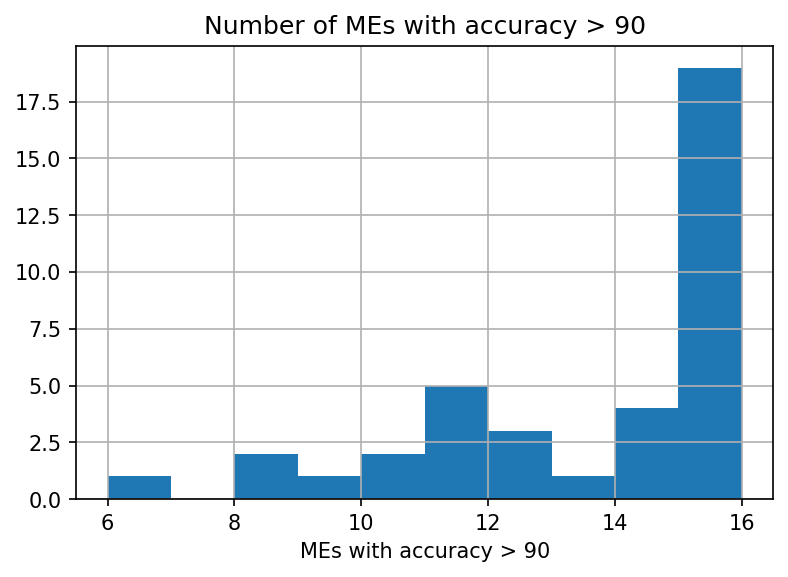

In [1066]:
fig, axes = plt.subplots(dpi=150)
axes = acc_df['above90'].hist()
axes.set_xlabel('MEs with accuracy > 90')
axes.set_title('Number of MEs with accuracy > 90')

In [1055]:
# acc_df.columns = [col.replace('_', ' ') for col in acc_df.columns]
acc_df.loc[:, :].round(3).to_csv('./accuracy_results.csv')

In [1056]:
acc_df

,fracabove90,above90,meanacc,chargeInner_PXLayer_1,chargeInner_PXLayer_2,chargeInner_PXLayer_3,chargeInner_PXLayer_4,chargeOuter_PXLayer_1,chargeOuter_PXLayer_2,chargeOuter_PXLayer_3,chargeOuter_PXLayer_4,charge_PXDisk_+1,charge_PXDisk_+2,charge_PXDisk_+3,charge_PXDisk_-1,charge_PXDisk_-2,charge_PXDisk_-3,num_clusters_ontrack_PXBarrel,num_clusters_ontrack_PXForward
fromrun,,,,,,,,,,,,,,,,,,,
297050,1.0000,16,0.994799,0.997179,1.000000,1.000000,1.000000,0.997179,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.998590,0.923836
297057,1.0000,16,0.993557,0.985109,1.000000,1.000000,1.000000,0.990836,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.994273,0.926690
297099,0.8750,14,0.875000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
297101,0.9375,15,0.943344,0.996700,1.000000,1.000000,1.000000,0.997800,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.910891,0.188119
297113,1.0000,16,0.994141,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.995536,0.910714
297114,1.0000,16,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
297175,1.0000,16,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
297177,1.0000,16,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
297215,0.8750,14,0.875000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000


With these results, we can make some plots to visualize the accuracydd of the certficiations made by shifters as measured with an autoencoder ensemble.

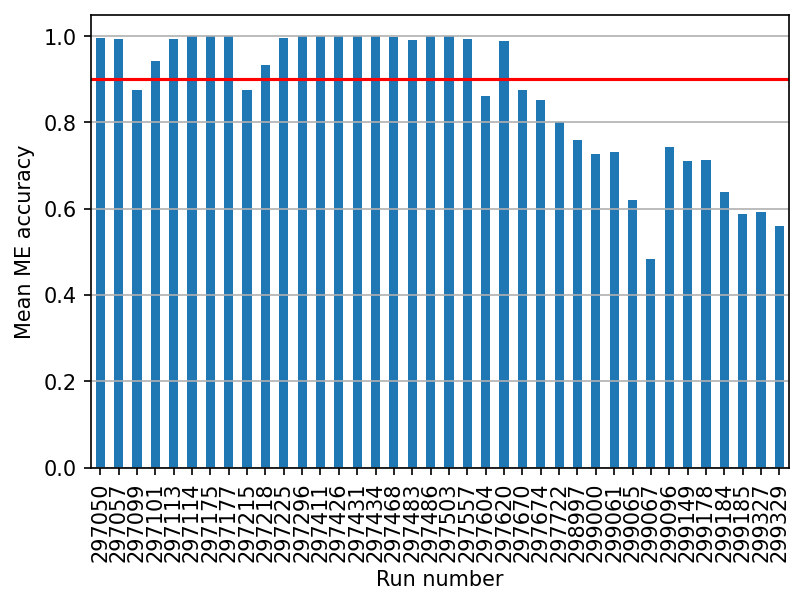

In [943]:
fig, axes = plt.subplots(dpi=150)
axes = acc_df['meanacc'].plot(kind='bar')
axes.set_xlabel('Run number')
axes.set_ylabel('Mean ME accuracy')
axes.plot(range(-10, 60), [0.9]*70, color='r')
axes.grid(axis='y')
plt.show()

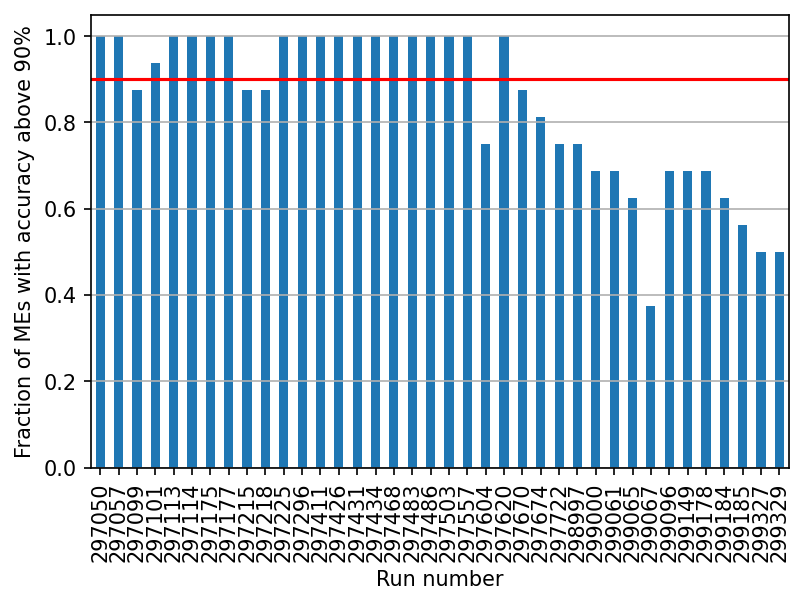

In [896]:
fig, axes = plt.subplots(dpi=150)
axes = acc_df['fracabove90'].plot(kind='bar')
axes.set_xlabel('Run number')
axes.set_ylabel('Fraction of MEs with accuracy above 90%')
axes.plot(range(-10, 60), [0.9]*70, color='r')
axes.grid(axis='y')
plt.show()

And as an example, we can look at one of the runs' monitoring elements and their reconstructions.

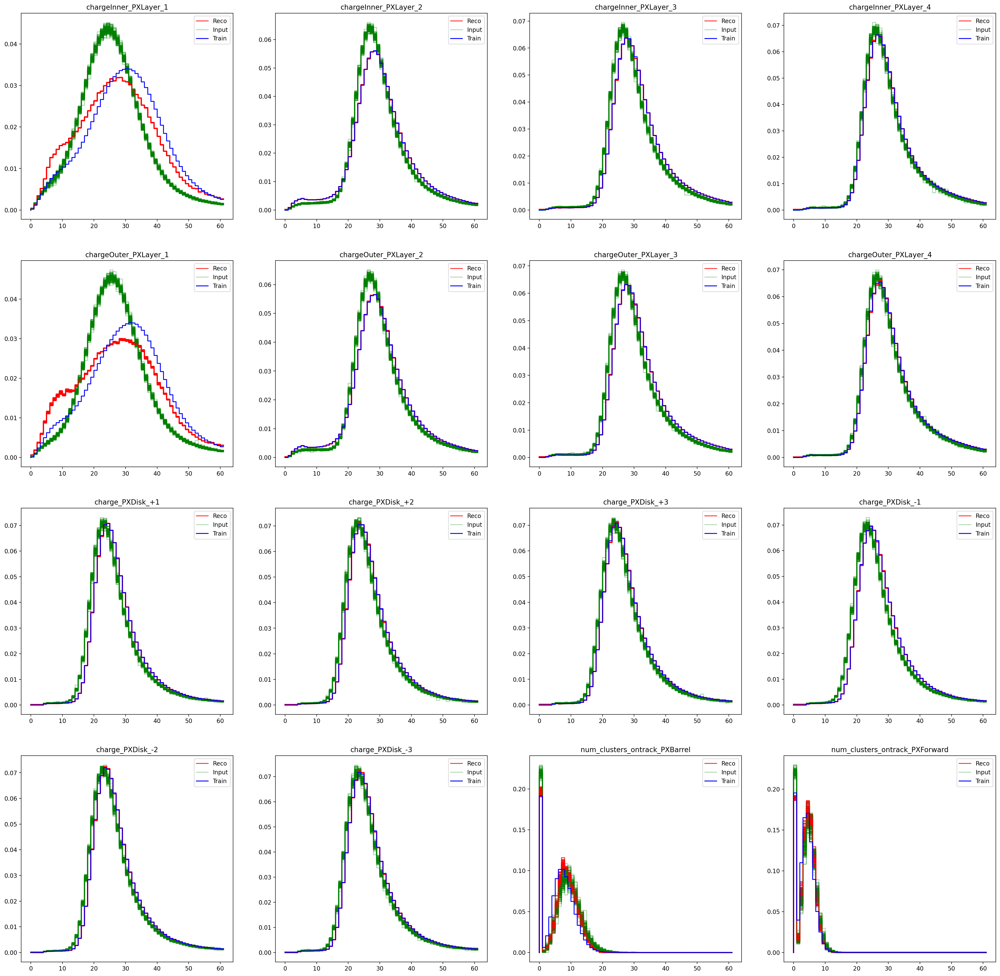

In [989]:
pltu.plotallMEs(eval_recos, evalruns_norm, Xs_train_norm, monitoring_elems, k=-1)

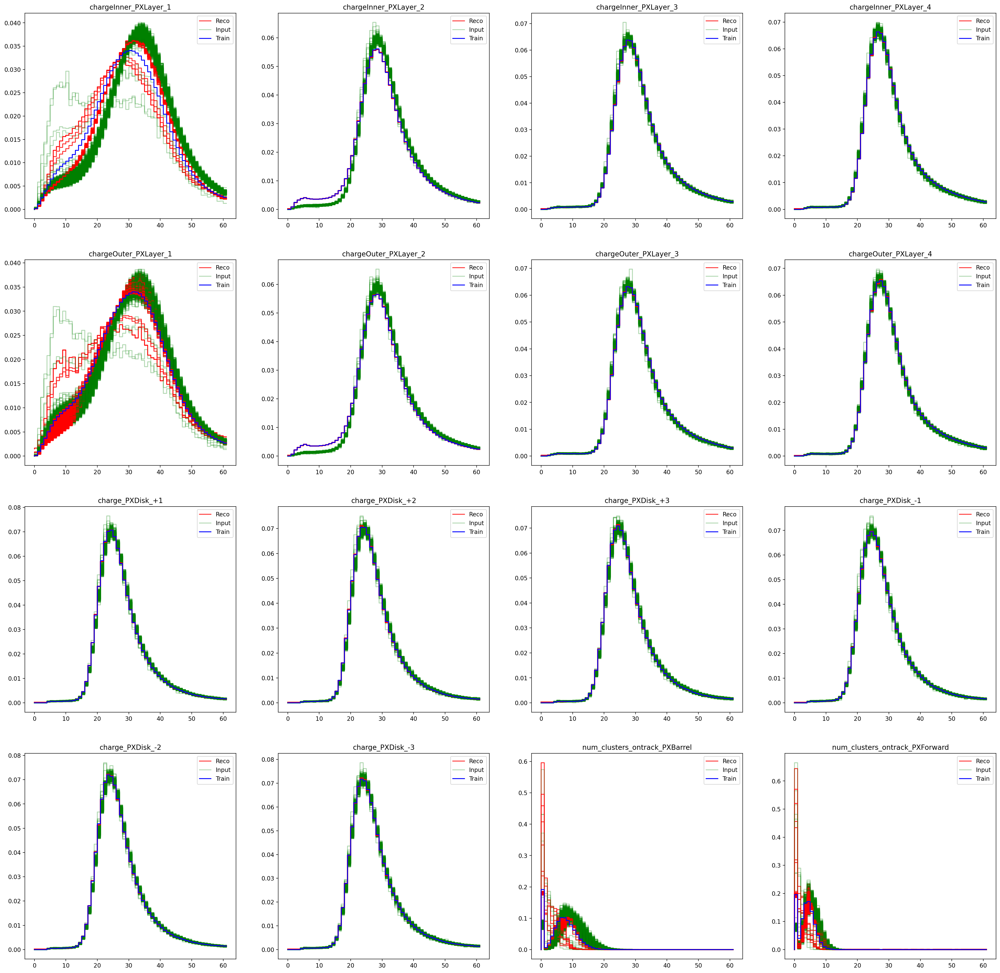

In [1058]:
pltu.plotallMEs(eval_recos, evalruns_norm, Xs_train_norm, monitoring_elems, k=0)

In [956]:
accSimConds_df = acc_df.loc[:297620]
accSimCondsAnomalous_df = accSimConds_df[accSimConds_df.loc[:, 'chargeInner_PXLayer_1':].T.describe().loc['min'] < 0.90].reset_index()

In [957]:
accSimConds_df

,chargeInner_PXLayer_1,fracabove90,above90,meanacc,chargeInner_PXLayer_2,chargeInner_PXLayer_3,chargeInner_PXLayer_4,chargeOuter_PXLayer_1,chargeOuter_PXLayer_2,chargeOuter_PXLayer_3,chargeOuter_PXLayer_4,charge_PXDisk_+1,charge_PXDisk_+2,charge_PXDisk_+3,charge_PXDisk_-1,charge_PXDisk_-2,charge_PXDisk_-3,num_clusters_ontrack_PXBarrel,num_clusters_ontrack_PXForward
fromrun,,,,,,,,,,,,,,,,,,,
297050,0.997179,1.1250,17,0.994799,1.000000,1.000000,1.000000,0.997179,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.998590,0.923836
297057,0.985109,1.1250,17,0.993557,1.000000,1.000000,1.000000,0.990836,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.994273,0.926690
297099,1.000000,0.9375,14,0.875000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
297101,0.996700,1.0625,16,0.943344,1.000000,1.000000,1.000000,0.997800,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.910891,0.188119
297113,1.000000,1.1250,17,0.994141,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.995536,0.910714
297114,1.000000,1.1250,17,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
297175,1.000000,1.1250,17,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
297177,1.000000,1.1250,17,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
297215,1.000000,0.9375,14,0.875000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000


In [958]:
accSimCondsAnomalous_df

,fromrun,chargeInner_PXLayer_1,fracabove90,above90,meanacc,chargeInner_PXLayer_2,chargeInner_PXLayer_3,chargeInner_PXLayer_4,chargeOuter_PXLayer_1,chargeOuter_PXLayer_2,chargeOuter_PXLayer_3,chargeOuter_PXLayer_4,charge_PXDisk_+1,charge_PXDisk_+2,charge_PXDisk_+3,charge_PXDisk_-1,charge_PXDisk_-2,charge_PXDisk_-3,num_clusters_ontrack_PXBarrel,num_clusters_ontrack_PXForward
0,297099,1.0000,0.9375,14,0.875000,1.0,1.0,1.000000,1.0000,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,0.000000,0.000000
1,297101,0.9967,1.0625,16,0.943344,1.0,1.0,1.000000,0.9978,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,0.910891,0.188119
2,297215,1.0000,0.9375,14,0.875000,1.0,1.0,1.000000,1.0000,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,0.000000,0.000000
3,297218,1.0000,1.0000,15,0.933333,1.0,1.0,1.000000,1.0000,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,0.466667,0.466667
4,297604,1.0000,0.8125,12,0.862307,1.0,1.0,0.997429,1.0000,1.0,1.0,1.0,0.298201,0.874036,0.997429,0.07455,0.586118,0.969152,1.000000,1.000000


In [964]:
accSimCondsAnomalous = accSimCondsAnomalous_df['fromrun'].to_list()
print(accSimCondsAnomalous)

[297099, 297101, 297215, 297218, 297604]


In [966]:
# Plotting all potentially anomalous runs
i_anomalous = []
for run in accSimCondsAnomalous:
    i_anomalous.append(acc_df.reset_index()[acc_df.reset_index()['fromrun']==run].index.values.astype(int)[0])
i_anomalous

[2, 3, 8, 9, 21]

Now plotting run 297099


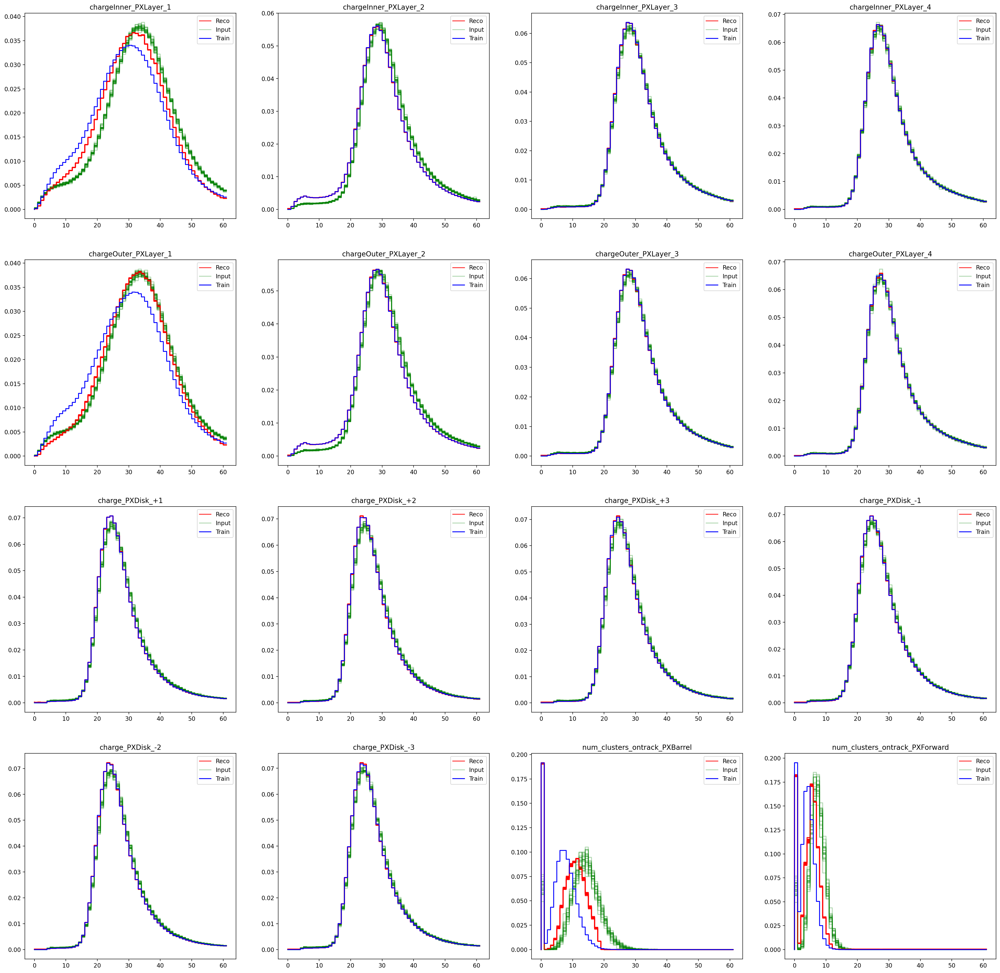

Now plotting run 297101


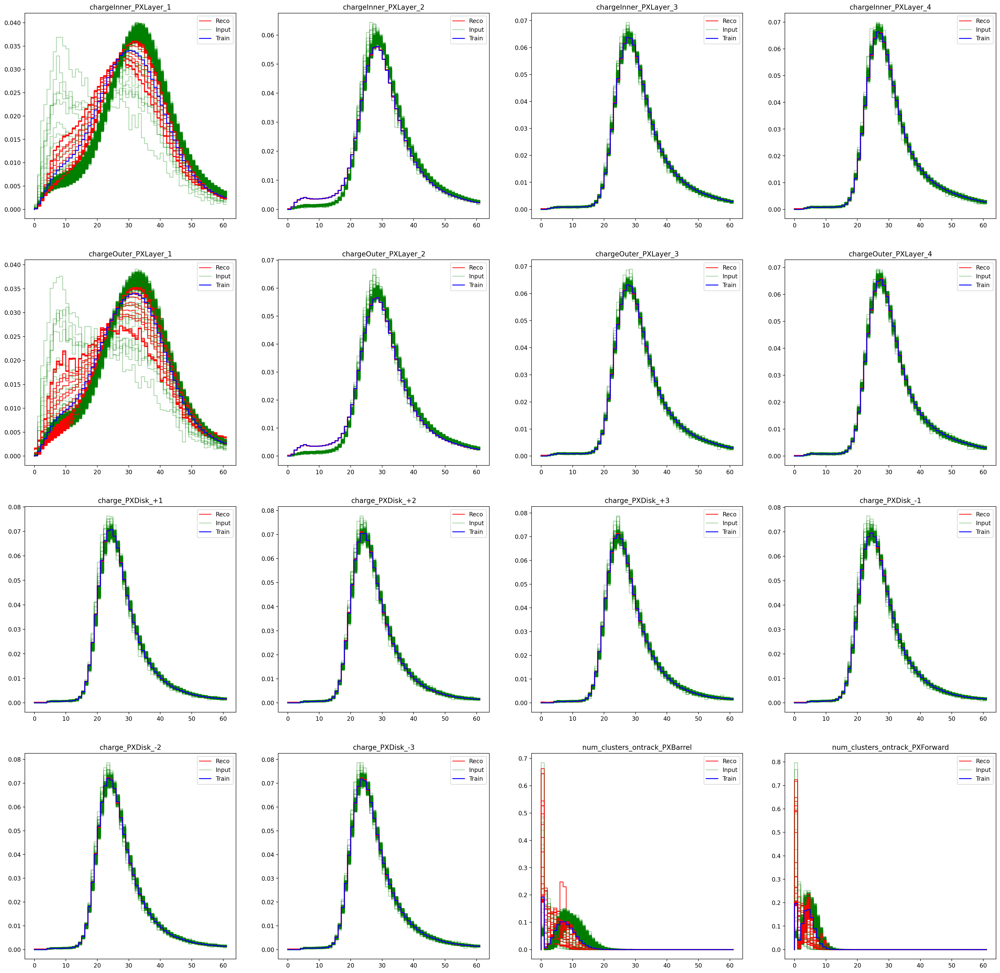

Now plotting run 297215


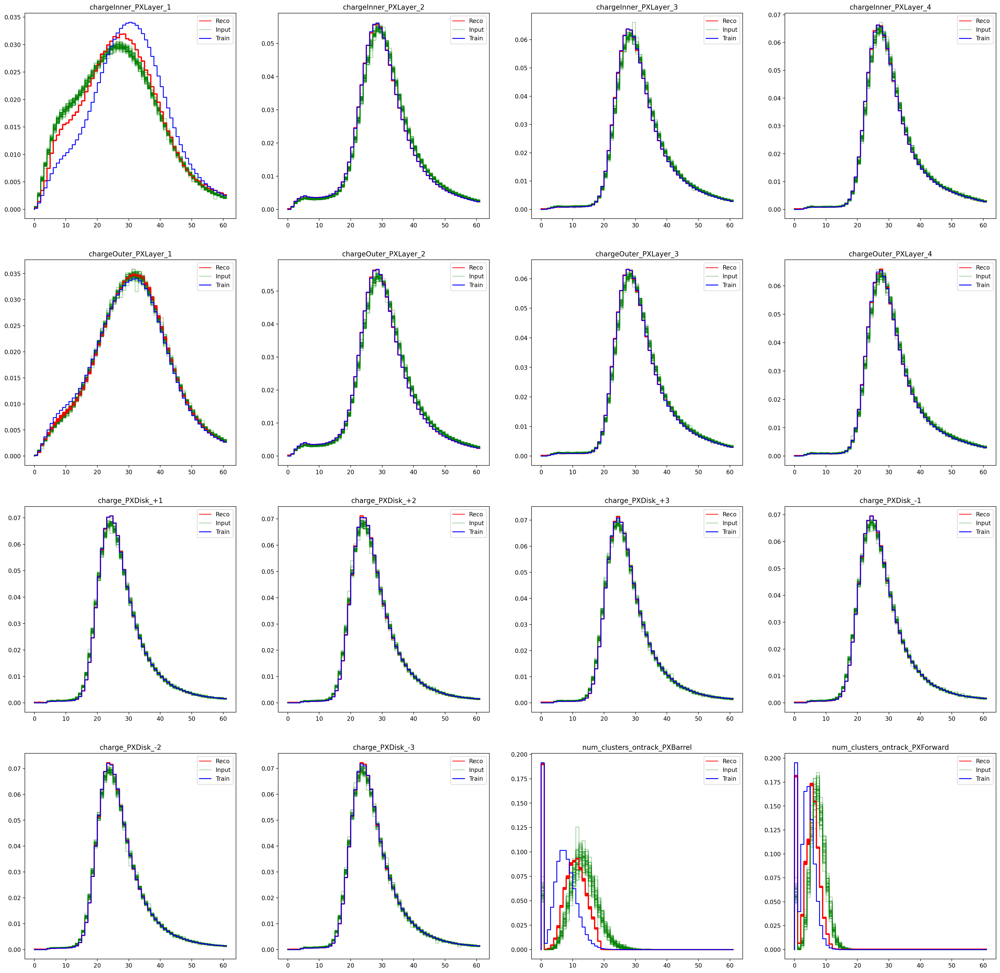

Now plotting run 297218


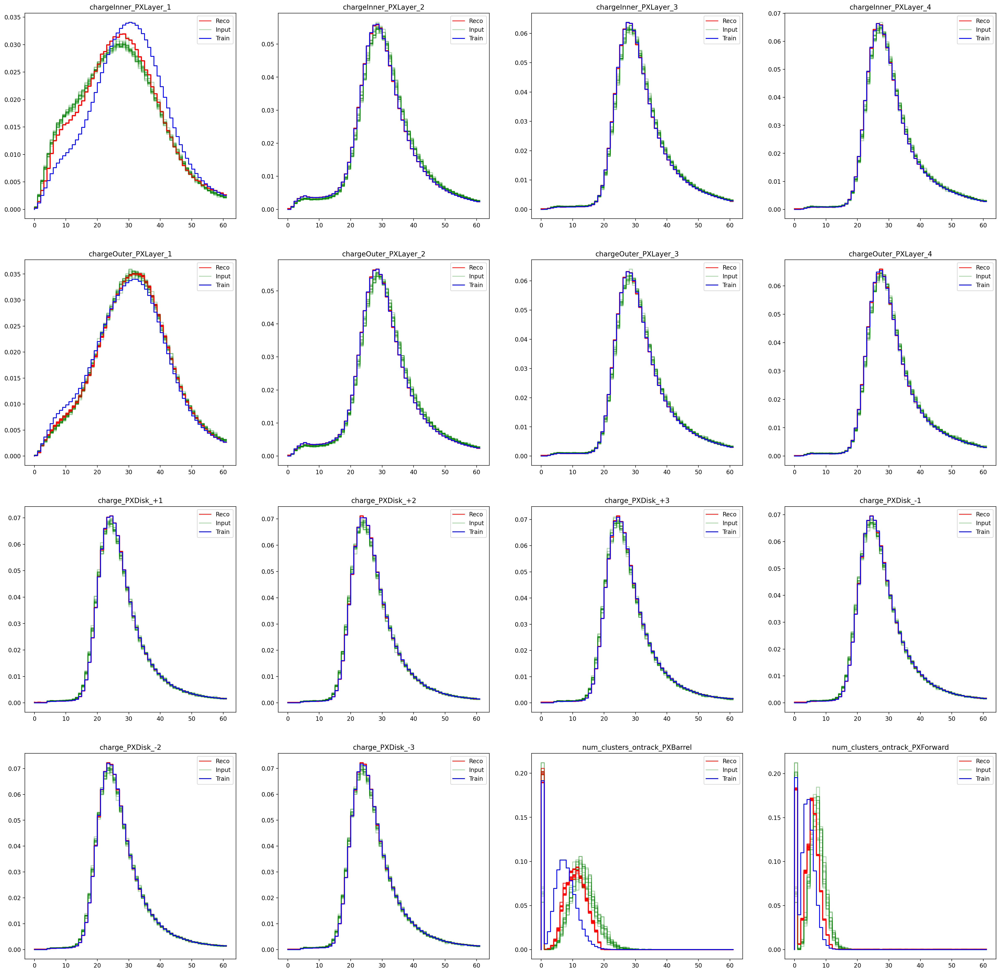

Now plotting run 297604


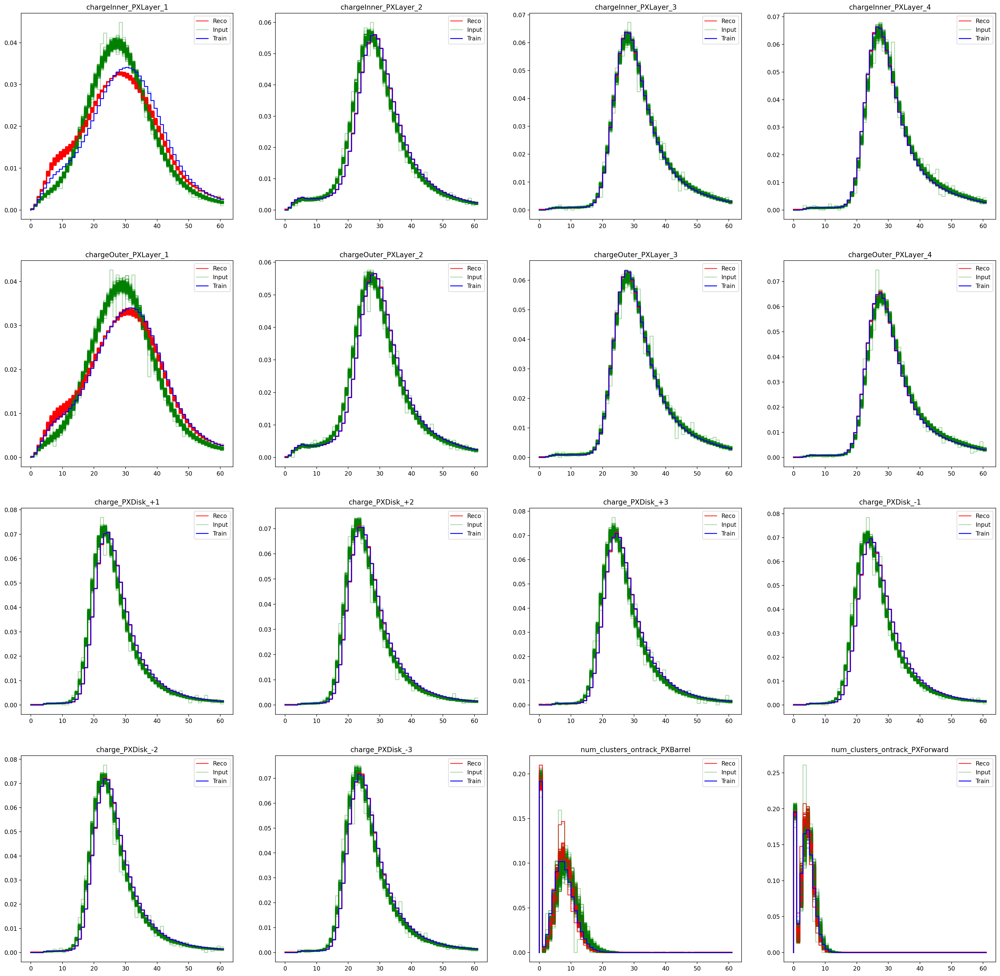

In [988]:
for index, run in zip(i_anomalous, accSimCondsAnomalous):
    print('Now plotting run', run)
    pltu.plotallMEs(eval_recos, evalruns_norm, Xs_train_norm, monitoring_elems, k=index)

In [1012]:
# Total num of LSs
totalLSs = 0
for reco in eval_recos:
    totalLSs += reco.shape[1]
totalLSs *= 16
print('Total number of LSs:', totalLSs)

Total number of LSs: 172912
